This notebook will pull and save all orbits including:
- z=1, 1.5, 2
- separations, velocities, merger flag, time/snapshot of merger, subhalo ID 1 & 2, mass

idea: Maybe need to add nans into columns where they don’t have a separation (so that I only have to save the time/redshift/etc. once~


**goal for today:**
- save all orbits for all pairs



In [1]:
import os
import h5py
import numpy as np
import matplotlib.pyplot as plt
import sys
import importlib
from astropy.cosmology import FlatLambdaCDM

from utils_orbs.orb_paths import SetupPaths
import utils_orbs.readsubfHDF5Py3 as readSub
# from utils.read_group_cats import ReadCats
from utils_orbs.merger_trees import TraceMergerTree
from utils_orbs.readMergerHistoryFiles import FindHistory
from utils_orbs.vectorCorrection import vectorCorrection as vector

paths = SetupPaths()

imported h5py...
modules seem to have loaded?


In [2]:
plt.show();
plt.rcParams.update({'font.size':20,"xtick.direction":"in","ytick.direction":"in", 
                     "xtick.top":True, "ytick.right":True,"text.usetex":False,
                     "xtick.labelsize":18,"ytick.labelsize":18})

## Make the time, redshift, scale, snapshot conversion file

First, I need to make the sim data arrays, including the time, redshift, and scale at each snapshot. (I might have this as a data file from a long time ago)


In [3]:
if os.path.exists(f"{paths.path_data}snapshot_data.hdf5"):
    print ("file already exists")
    
else:    
    ## import simulation snapshot data 
    f = h5py.File(paths.path_data+"simulation.hdf5")

    ## initialize cosmology
    H0 = 100*f['Header'].attrs['HubbleParam']
    Omega0 = f['Header'].attrs['Omega0']
    OmegaB = f['Header'].attrs['OmegaBaryon']
    OmegaL = f['Header'].attrs['OmegaLambda']

    cosmo = FlatLambdaCDM(H0=67.74, Om0=Omega0, Ob0=OmegaB)

    ## initialize data structure
    data_dict = {}
    array_names = ["Snapshot","Redshift","Scale","Lookback Time","Age"]
    for arr in array_names:
        data_dict[arr] = []

    ## create data structure for time, redshift, scale, etc. as fxn of snapshot
    for i in range(100):
        snapshot = i
        redshift = f['Snapshots'][f'{i}']['Header'].attrs['Redshift']
        scale = 1 / (1 + redshift)
        lookback = cosmo.lookback_time(redshift).value
        age = cosmo.age(redshift).value

        data_dict['Snapshot'].append(snapshot)
        data_dict['Redshift'].append(redshift)
        data_dict['Scale'].append(scale)
        data_dict['Lookback Time'].append(lookback)
        data_dict['Age'].append(age)

    ## clsoe data file     
    f.close()

    ## store time data into hdf5 file ~

    f = h5py.File(f"{paths.path_data}snapshot_data.hdf5", 'w')

    info_dict = {"Snapshot":"Snapshot number",
                 "Redshift":"Redshift at snapshot",
                 "Scale":"Scale at snapshot",
                 "Lookback Time":"Time that has elapsed from snapshot to z=0 (in Gyr)",
                 "Age":"Age of the Universe (in Gyr)"}

    for key, val in data_dict.items():
        val = np.array(val)
        dset = f.create_dataset(f'/{key}', 
                                shape=val.shape,
                                dtype=val.dtype)
        dset.attrs[key] = info_dict[key]
        dset[:] = val

    f.close()    
    
    print("snapshot information file created")

snapshot information file created


## Need to get data for the pairs:


first, I'm going to build the arrays of the ids, the snap of merger, and the merger flag. later i'll add in the 2D arrays of positions, velocities, etc. 

In [91]:
def save_orbitdata(red):
       
    snap_dict = {"z=1":50,"z=1.5":40,"z=2":33}
    snapshot = snap_dict[f"z={red}"]
    full_snaps = np.arange(99,0,-1)
    little_h = 0.6774
    
    if os.path.exists(f"{paths.path_data}orbitdata_{snapshot}.hdf5"):
        print ("file already exists")
    
    else:
        # ----------------------------------------------------
        # import pair data
        f = h5py.File(f"../data/lowmass_{snapshot}.hdf5", 'r')
        pairs = {}
        for key, val in f.items():
            if key != "Header":
                pairs[key] = np.array(val) 
        f.close()
        numpairs = len(pairs['Sub1 ID'])

        # ----------------------------------------------------
        # import snapshot data to convert comoving units
        snapdata = h5py.File(f"{paths.path_data}snapshot_data.hdf5","r")
        snapdata_dict={}
        for key,val in snapdata.items():
            snapdata_dict[key] = np.array(val)
        snapdata.close()

        # ----------------------------------------------------
        # initialize data structures  
        collection = {}
        id1, id2, mass1, mass2, smratio, merged_flag, snap_merged = np.zeros((7,numpairs))
        group_flag = np.zeros((numpairs,len(full_snaps)),dtype="bool")
        seps = np.zeros((numpairs,len(full_snaps)))
        vels = np.zeros((numpairs,len(full_snaps)))
        seps.fill(np.NaN)
        vels.fill(np.NaN)


        for ind in range(numpairs):
            # ----------------------------------------------------
            # get info and trees for primary and secondary
            primary_id = pairs['Sub1 ID'][ind]
            secondary_id = pairs['Sub2 ID'][ind]

            id1[ind] = primary_id
            id2[ind] = secondary_id
            mass1[ind] = pairs['Sub1 Stellar Mass'][ind]
            mass2[ind] = pairs['Sub2 Stellar Mass'][ind]
            smratio[ind] = pairs['Stellar Mass Ratio'][ind]

            treedict = {}
            for sub in [primary_id,secondary_id]:
                treedict[sub] = TraceMergerTree(snapshot=snapshot,physics="hydro",sim="TNG",subfindID=sub)

            tree_primary = treedict[primary_id].mergedbranch
            tree_secondary = treedict[secondary_id].mergedbranch

            # ----------------------------------------------------
            # check to see if halos merge
            root1 = tree_primary['RootDescendantID'][0]
            root2 = tree_secondary['RootDescendantID'][0]
            check_root = root1 == root2

            snap_mask1 = np.isin(tree_primary['SnapNum'],tree_secondary['SnapNum'])
            snap_mask2 = np.isin(tree_secondary['SnapNum'],tree_primary['SnapNum'])

            if check_root:
                merged_flag[ind] = True

                # ----------------------------------------------------
                # identify the snapshot at which the halos have merged
                desc_mask1 = np.isin(tree_primary['DescendantID'],tree_secondary['DescendantID'])
                desc_mask2 = np.isin(tree_secondary['DescendantID'],tree_primary['DescendantID'])

                desc_overlap1 = tree_primary["SnapNum"][desc_mask1]
                desc_overlap2 = tree_secondary["SnapNum"][desc_mask2]

                if desc_overlap1[-1] == desc_overlap2[-1]:
                    snap_merged[ind] = desc_overlap1[-1]+1
                    # this is the case when there are no snapshots skipped

                elif abs(desc_overlap1[-1]-desc_overlap2[-1])==1:
                    snap_merged[ind] = np.min(np.intersect1d(desc_overlap1,desc_overlap2))
                    # this is the case when the secondary snapshot temporarily enters 
                    # the primary halo thus skipping a snapshot
            else:
                snap_merged[ind] = np.NaN


            # ----------------------------------------------------
            # collect separations, vels, etc. as function of snap
            for index,snap in enumerate(full_snaps):
                scale = snapdata_dict['Scale'][np.where(snapdata_dict['Snapshot'] == snap)[0]]

                # ----------------------------------------------------
                # test if both subhalos have data at the snapshot
                if (snap in tree_primary['SnapNum']) and (snap in tree_secondary['SnapNum']):
                    # location of snapshot in trees
                    loc1 = np.where(tree_primary['SnapNum'] == snap)[0]
                    loc2 = np.where(tree_secondary['SnapNum'] == snap)[0]

                    # ----------------------------------------------------
                    # change flag to True if subhalos in same group
                    grnum1 = tree_primary['SubhaloGrNr'][loc1]
                    grnum2 = tree_secondary['SubhaloGrNr'][loc2]
                    group_flag[ind][index] = grnum1 == grnum2

                    # ----------------------------------------------------
                    # calculate separation between both halos
                    pos1 = tree_primary['SubhaloPos'][loc1]
                    pos2 = tree_secondary['SubhaloPos'][loc2]
                    comoving_dist = np.linalg.norm(vector(pos1,pos2,75000))
                    seps[ind][index]=comoving_dist*(scale)/little_h

                    # ----------------------------------------------------
                    # calculate velocity between both halos
                    vel1 = tree_primary['SubhaloVel'][loc1]
                    vel2 = tree_secondary['SubhaloVel'][loc2]
                    rel_vel = np.linalg.norm(vel1-vel2)
                    vels[ind][index]=rel_vel

        # ----------------------------------------------------
        # make data structure and save to hdf5
        collection = {"SubfindID1":id1,
                      "SubfindID2":id2,
                      "StellarMass1":mass1,
                      "StellarMass2":mass2,
                      "StellarMassRatio":smratio,
                      "MergerSnapshot":snap_merged,
                      "MergerFlag":merged_flag,
                      "Separations":seps,
                      "Velocities":vels,
                      "GroupFlag":group_flag}


        f = h5py.File(f"{paths.path_data}orbitdata_{snapshot}.hdf5", 'w')

        info_dict = {"SubfindID1":"Subhalo ID of primary at selected redshift",
                      "SubfindID2":"Subhalo ID of secondary at selected redshift",
                      "StellarMass1":"Stellar mass from AM of primary at selected redshift",
                      "StellarMass2":"Stellar mass from AM of secondary at selected redshift",
                      "StellarMassRatio":"Stellar mass ratio of pair at selected redshift",
                      "MergerSnapshot":"Snapshot at which 'merger' has occured",
                      "MergerFlag":"True if subhalos will merge",
                      "Separations":"Physical separation between pair in kpc",
                      "Velocities":"Relative velocity between pair in km/s",
                      "GroupFlag":"True if subhalos are in the same group at that snapshot"}

        for key, val in collection.items():
            val = np.array(val)
            dset = f.create_dataset(f'/{key}', 
                                    shape=val.shape,
                                    dtype=val.dtype)
            dset.attrs[key] = info_dict[key]
            dset[:] = val

        f.close()    
        print("Saved orbit data for z=",red)

In [92]:
for i in [1,1.5,2]:
    save_orbitdata(i)
    print("Saved orbit data for z=",i)

Saved orbit data for z= 1
Saved orbit data for z= 1
Saved orbit data for z= 1.5
Saved orbit data for z= 1.5
Saved orbit data for z= 2
Saved orbit data for z= 2


## Check data file

In [5]:
f = h5py.File(f"{paths.path_data}orbitdata_40.hdf5",'r')
check_dict = {}
for key, val in f.items():
    check_dict[key] = np.array(val)
f.close()

f = h5py.File(f"{paths.path_data}snapshot_data.hdf5",'r')
snap_dict = {}
for key, val in f.items():
    snap_dict[key] = np.array(val)
f.close()

In [6]:
# getting locations of all mergers
mergers = ~np.isnan(check_dict['MergerSnapshot'])
nonmergers = np.isnan(check_dict['MergerSnapshot'])

### Plots of pairs that merge

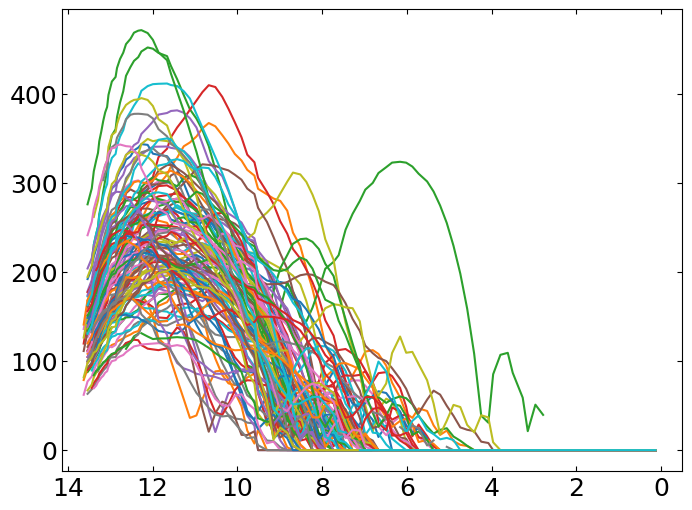

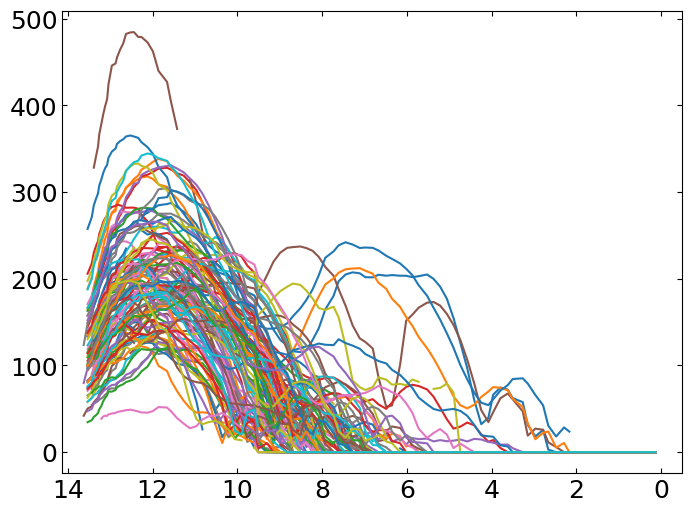

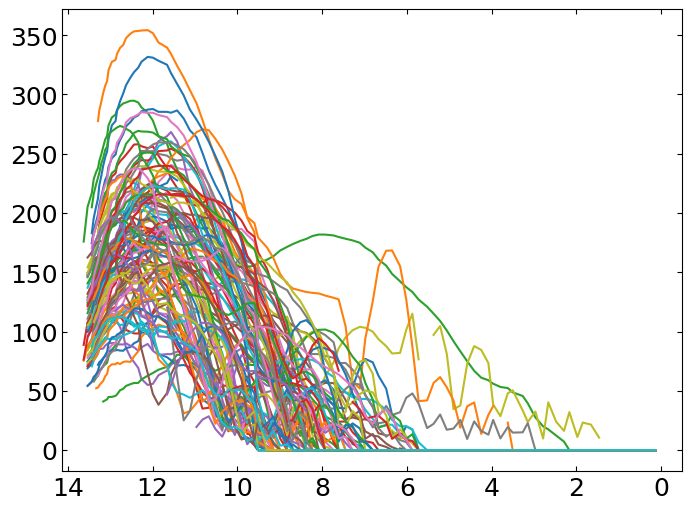

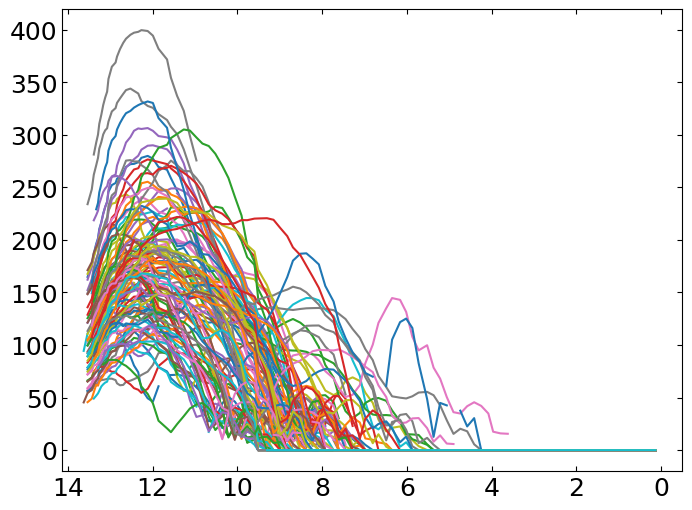

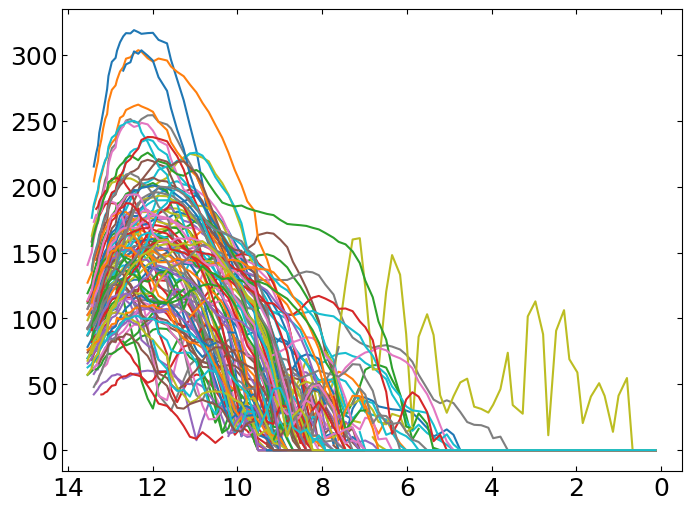

...

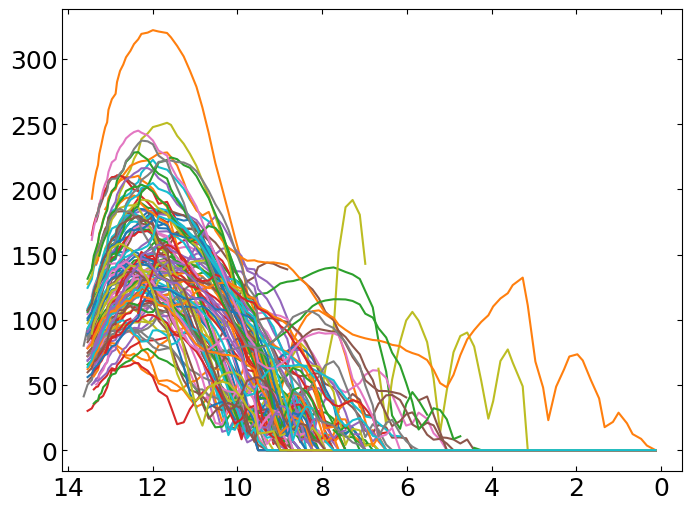

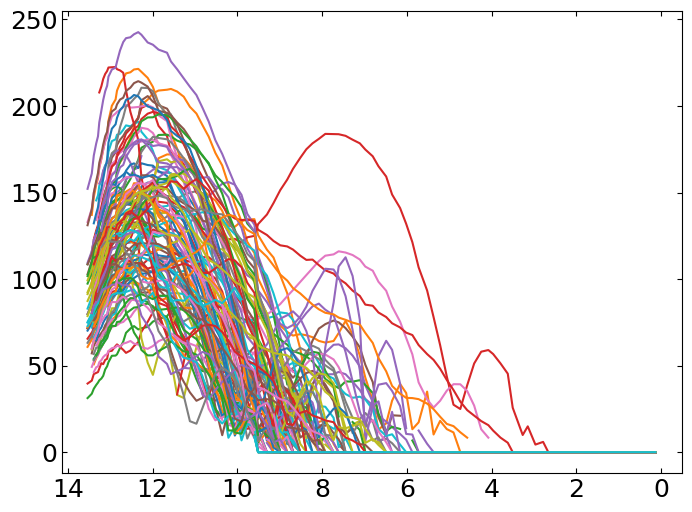

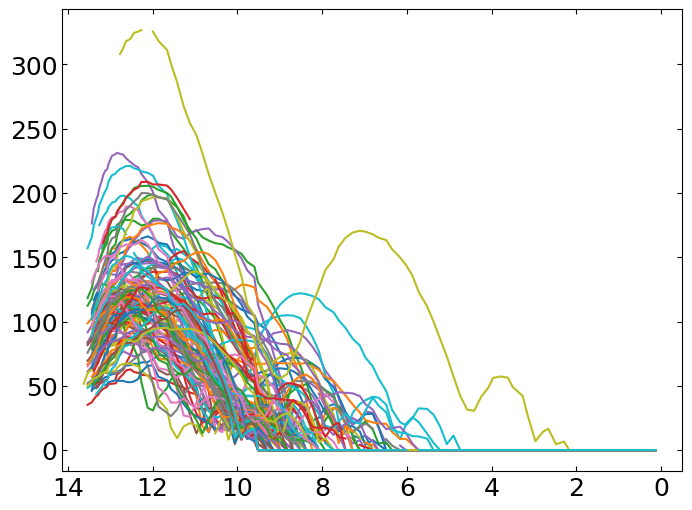

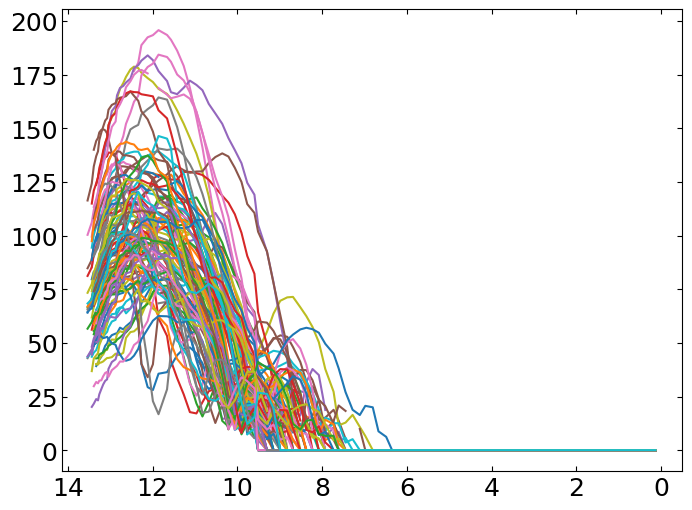

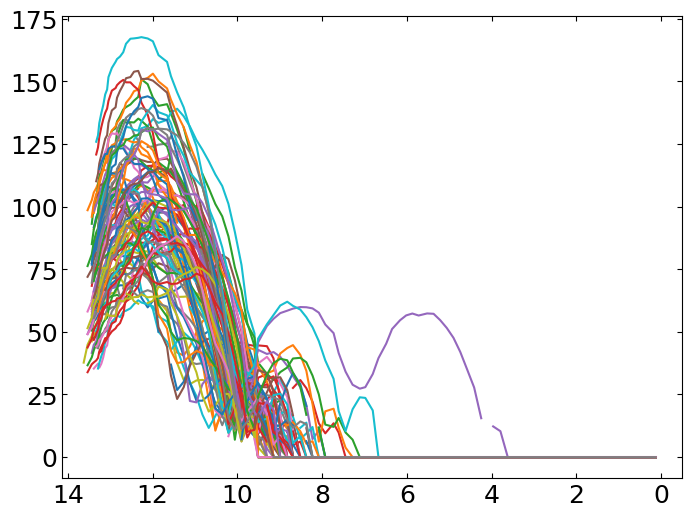

In [81]:

nummergers = len(check_dict['Separations'][mergers])
numnonmergers = len(check_dict['Separations'][nonmergers])

plotnum = 0
for i in range(nummergers):
    if plotnum%110 == 0:
        fig = plt.figure(figsize=(8,6))
    plotnum += 1
    plt.plot(snap_dict['Lookback Time'][::-1][1:],check_dict['Separations'][mergers][i])    
#     plt.legend()    
    plt.xlim(np.max(snap_dict['Lookback Time']+0.5),-0.5)
plt.show()


### Plots of pairs that don't merge

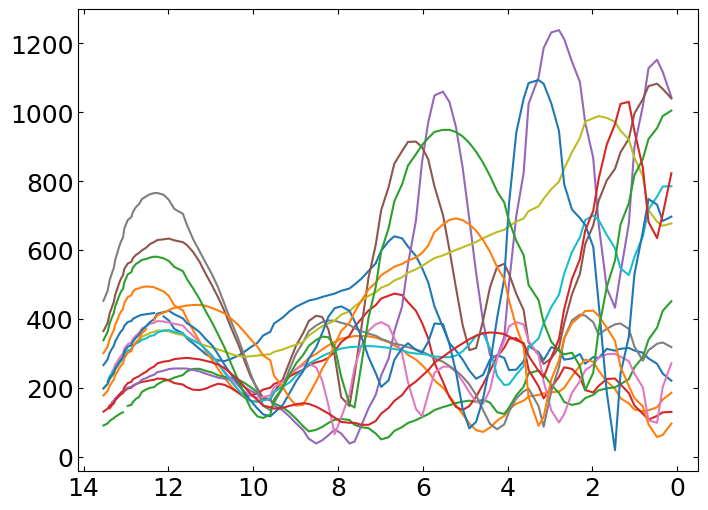

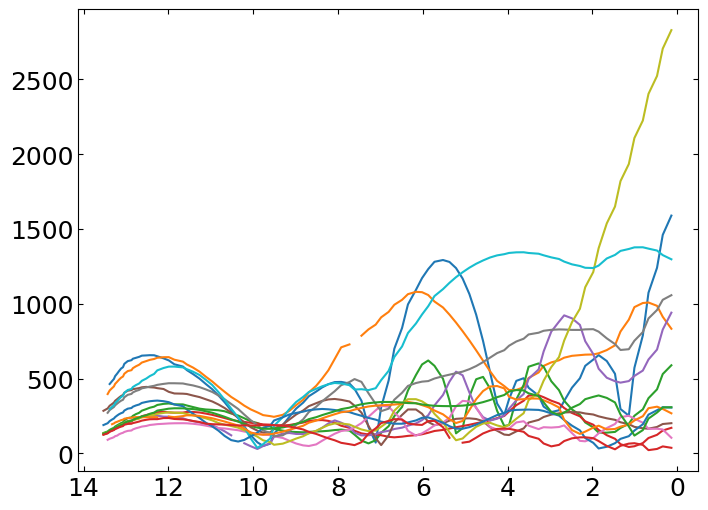

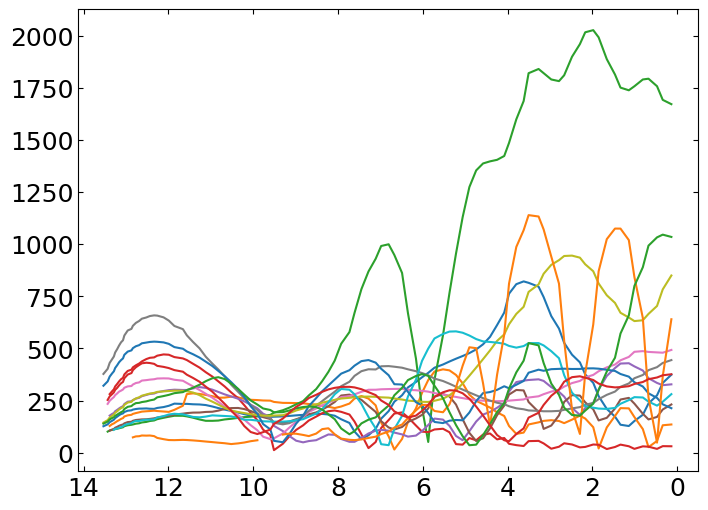

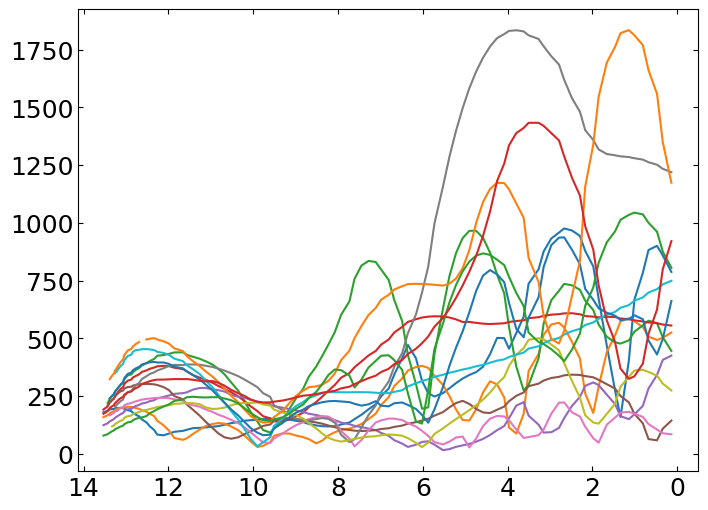

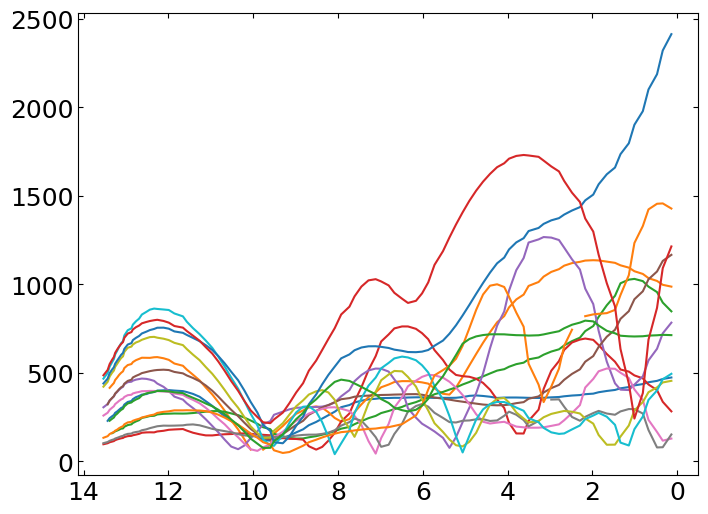

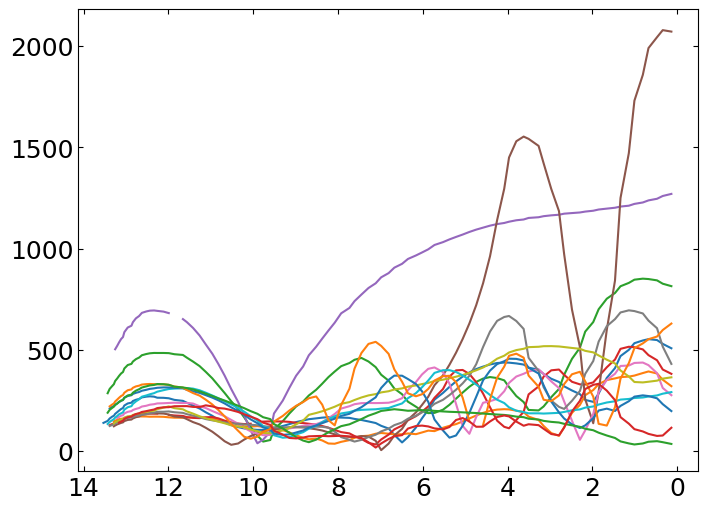

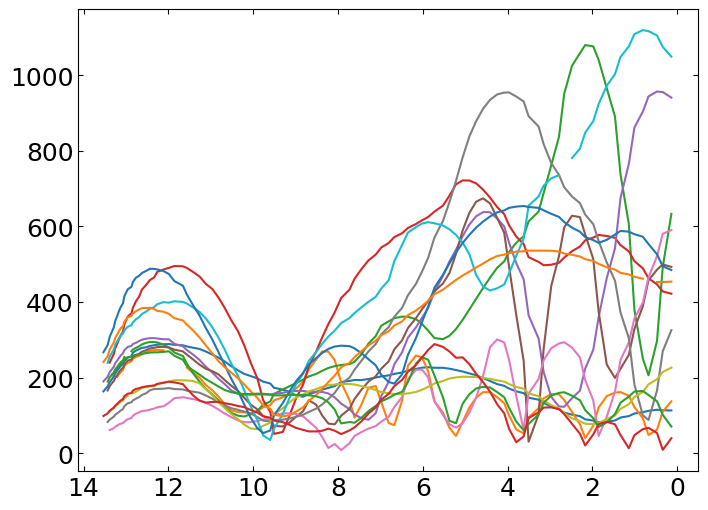

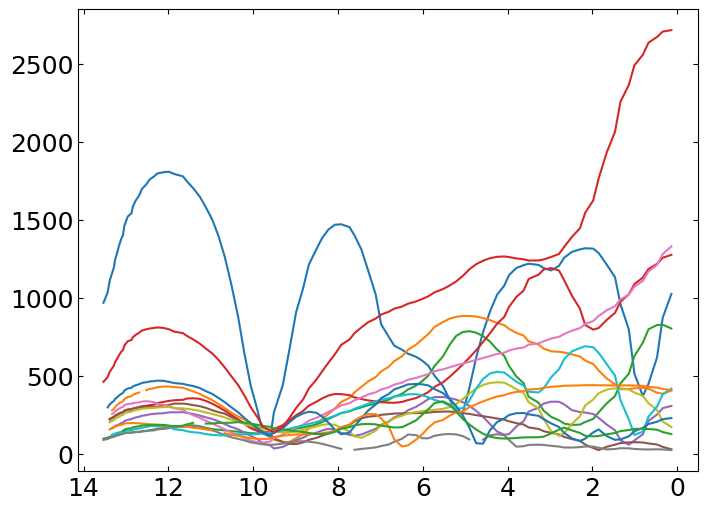

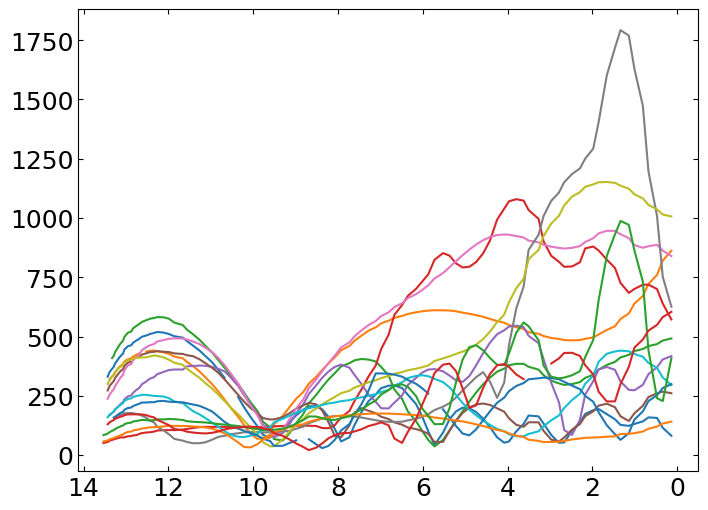

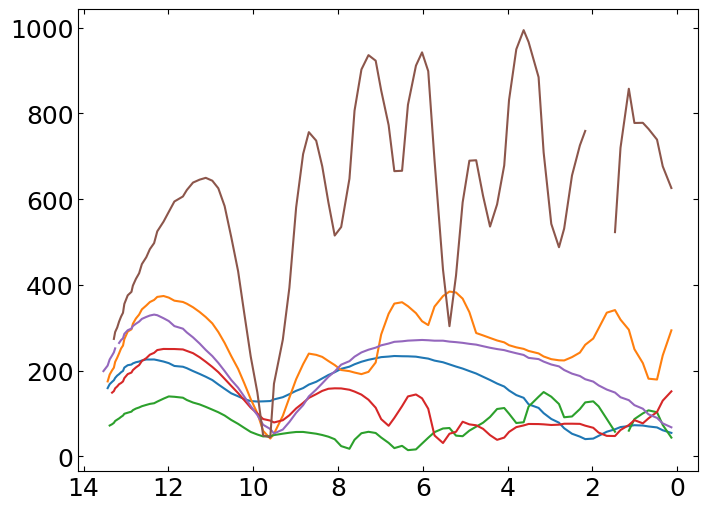

In [83]:

nummergers = len(check_dict['Separations'][mergers])
numnonmergers = len(check_dict['Separations'][nonmergers])

plotnum = 0
for i in range(numnonmergers):
    if plotnum%14 == 0:
        fig = plt.figure(figsize=(8,6))
    plotnum += 1
    plt.plot(snap_dict['Lookback Time'][::-1][1:],check_dict['Separations'][nonmergers][i])    
#     plt.legend()    
    plt.xlim(np.max(snap_dict['Lookback Time']+0.5),-0.5)
plt.show()


In [85]:
# getting locations of all mergers
samegroup = check_dict['GroupFlag']
# nonmergers = np.isnan(check_dict['MergerSnapshot'])
samegroup

array([[ True,  True,  True, ..., False, False, False],
       [ True,  True,  True, ..., False, False, False],
       [ True,  True,  True, ..., False, False, False],
       ...,
       [ True,  True,  True, ..., False, False, False],
       [ True,  True,  True, ..., False, False, False],
       [ True,  True,  True, ..., False, False, False]])

#### Plots of pairs that don't merge - only when they are still in the same group

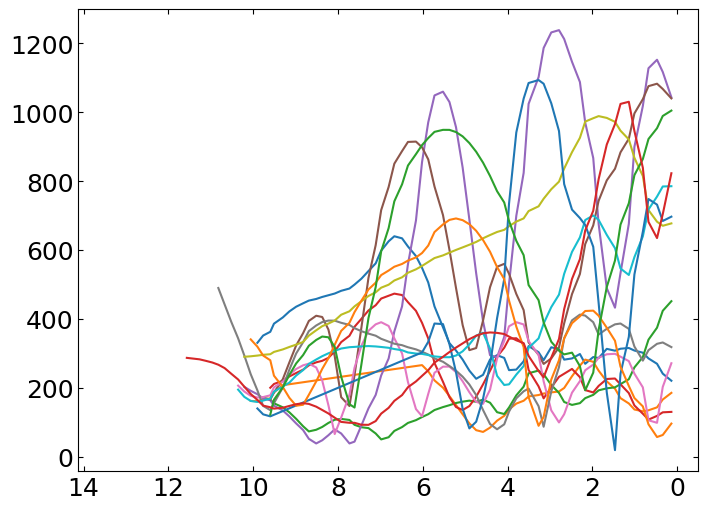

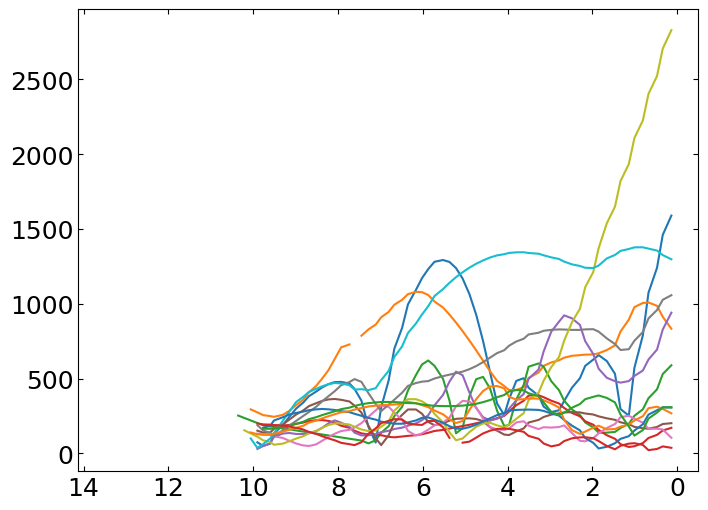

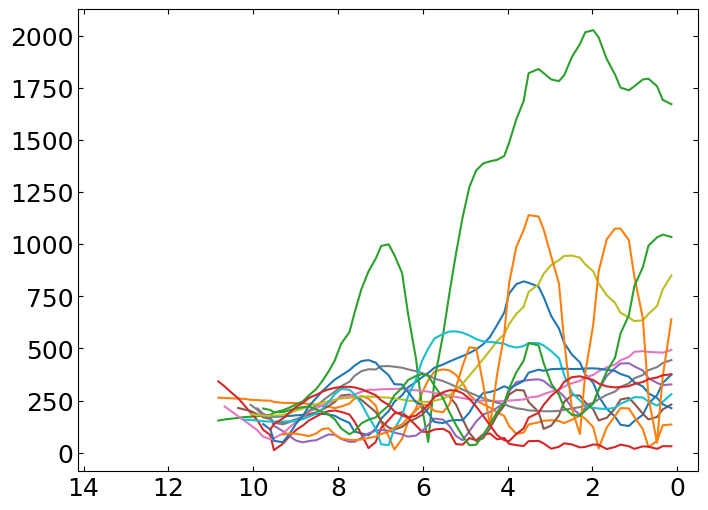

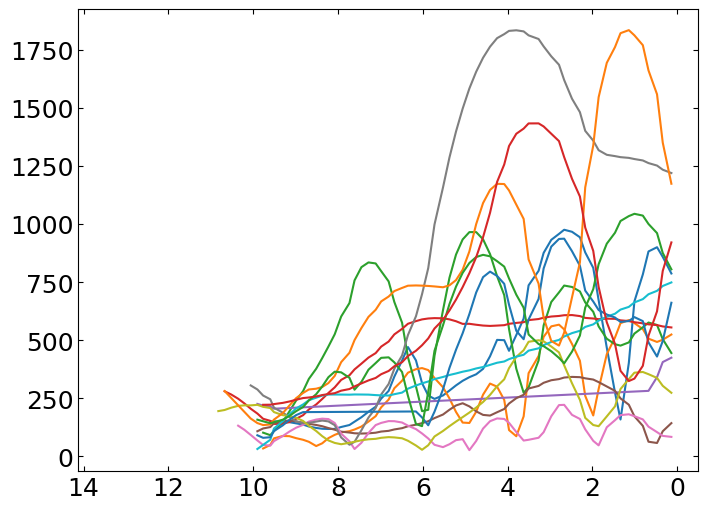

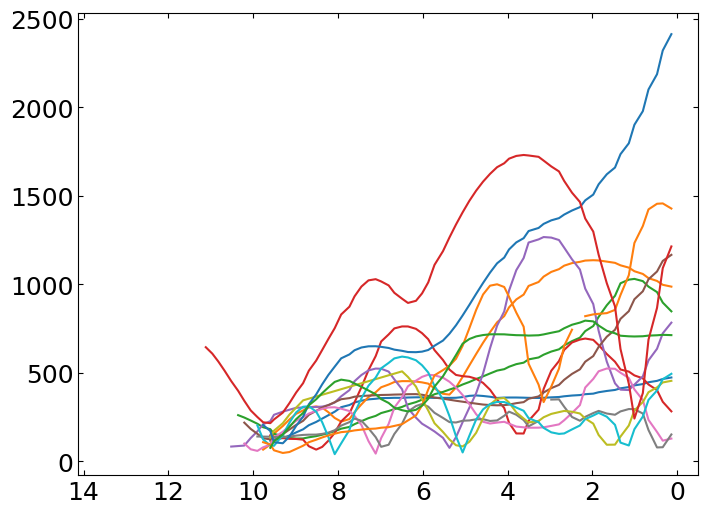

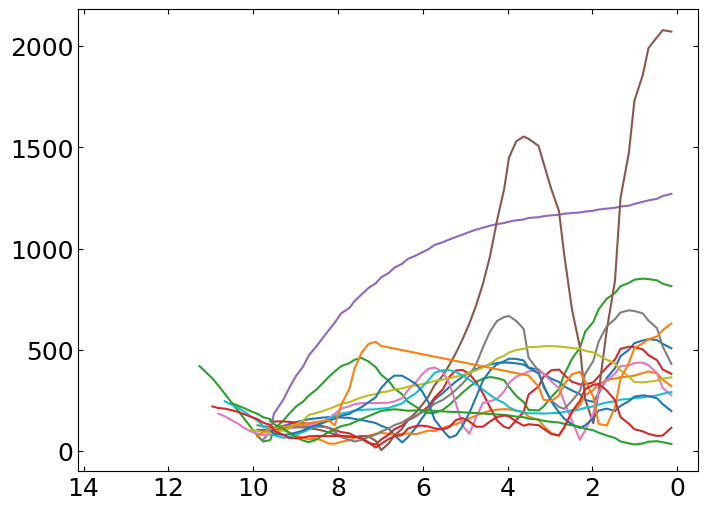

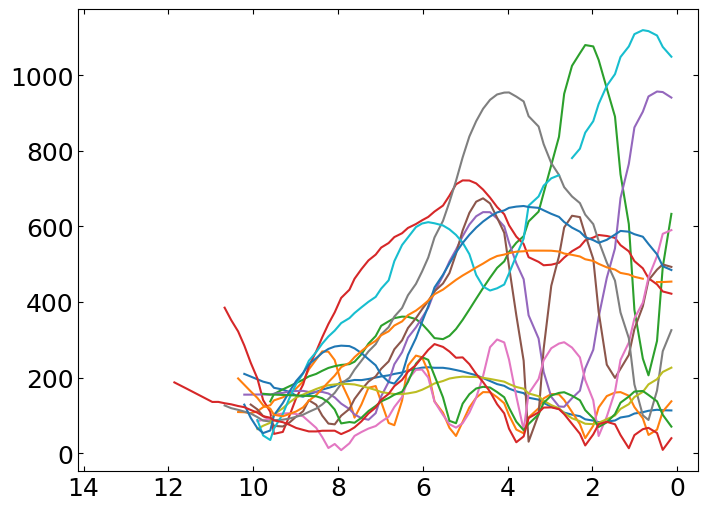

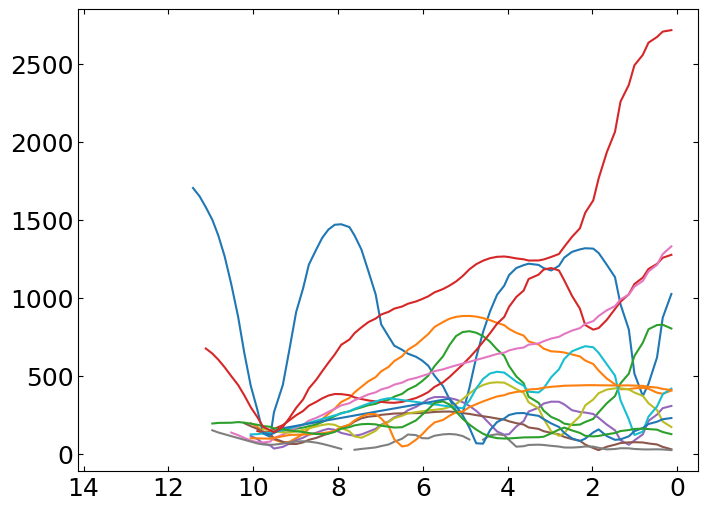

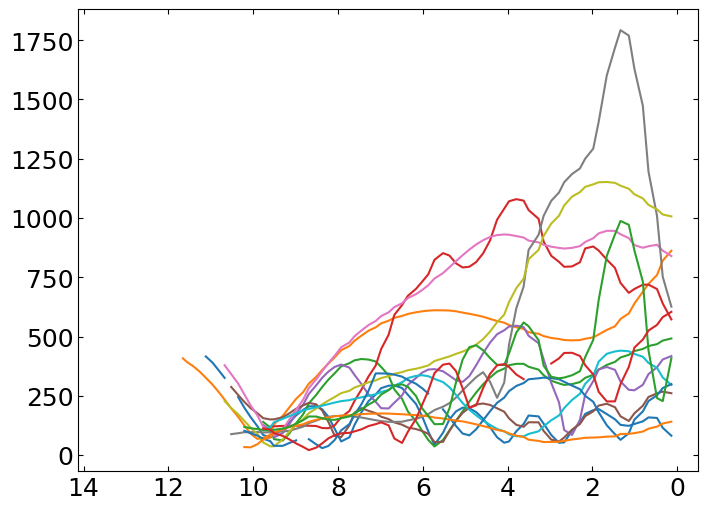

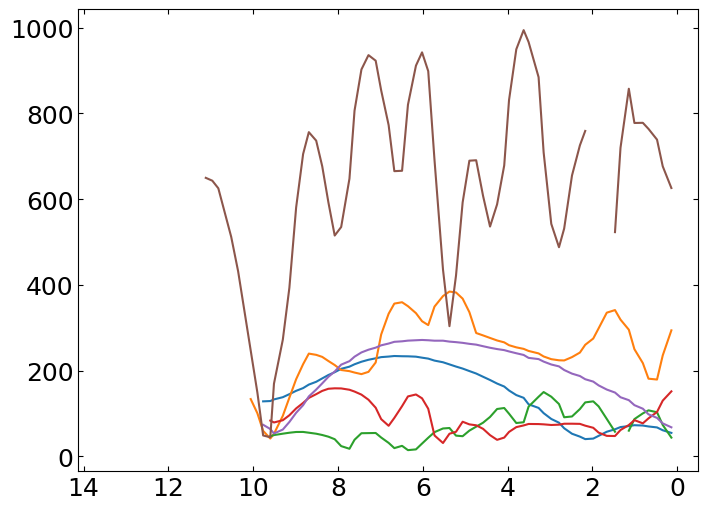

In [87]:
nummergers = len(check_dict['Separations'][mergers])
numnonmergers = len(check_dict['Separations'][nonmergers])

plotnum = 0
for i in range(numnonmergers):
    if plotnum%14 == 0:
        fig = plt.figure(figsize=(8,6))
    plotnum += 1
    plt.plot(snap_dict['Lookback Time'][::-1][1:][check_dict['GroupFlag'][i]],check_dict['Separations'][nonmergers][i][check_dict['GroupFlag'][i]])    
#     plt.legend()    
    plt.xlim(np.max(snap_dict['Lookback Time']+0.5),-0.5)
plt.show()


In [20]:
np.where(check_dict['MergerSnapshot']==np.NaN)

(array([], dtype=int64),)

In [49]:
len(snap_dict['Lookback Time'][1:])

99

In [37]:
print(len(check_dict['Separations'][mergers]))
print(len(check_dict['Separations'][nonmergers]))

1198
132


In [48]:
len(check_dict['Separations'][mergers][0])

99

In [71]:
snap_dict['Lookback Time'][::-1][1:]

array([ 0.13648833,  0.34007461,  0.47502133,  0.67625252,  0.80960087,
        1.0083923 ,  1.14008622,  1.33635449,  1.4663389 ,  1.66000232,
        1.85206448,  1.97920241,  2.16853359,  2.29382551,  2.48035043,
        2.66515681,  2.78739386,  2.96928046,  3.14938326,  3.26844946,
        3.50414693,  3.6207657 ,  3.79413961,  3.96563147,  4.07890482,
        4.24722031,  4.41360808,  4.57805312,  4.74054166,  4.90106113,
        5.0596002 ,  5.21614881,  5.37069816,  5.52324072,  5.7234985 ,
        5.87133643,  6.01715166,  6.16094216,  6.34951208,  6.48857728,
        6.6708518 ,  6.80520283,  6.98120678,  7.11086956,  7.28064697,
        7.4468931 ,  7.6096314 ,  7.7293989 ,  7.92469312,  8.07707784,
        8.22607695,  8.37172731,  8.51406791,  8.68740199,  8.82244839,
        8.98680396,  9.14629731,  9.30102237,  9.50981086,  9.59655574,
        9.76523678,  9.90101118, 10.0583425 , 10.2097357 , 10.35536972,
       10.51823531, 10.67378679, 10.82230287, 10.96405813, 11.11

In [68]:
snap_dict['Lookback Time'][::-1]

array([1.77635684e-15, 1.36488333e-01, 3.40074606e-01, 4.75021330e-01,
       6.76252517e-01, 8.09600867e-01, 1.00839230e+00, 1.14008622e+00,
       1.33635449e+00, 1.46633890e+00, 1.66000232e+00, 1.85206448e+00,
       1.97920241e+00, 2.16853359e+00, 2.29382551e+00, 2.48035043e+00,
       2.66515681e+00, 2.78739386e+00, 2.96928046e+00, 3.14938326e+00,
       3.26844946e+00, 3.50414693e+00, 3.62076570e+00, 3.79413961e+00,
       3.96563147e+00, 4.07890482e+00, 4.24722031e+00, 4.41360808e+00,
       4.57805312e+00, 4.74054166e+00, 4.90106113e+00, 5.05960020e+00,
       5.21614881e+00, 5.37069816e+00, 5.52324072e+00, 5.72349850e+00,
       5.87133643e+00, 6.01715166e+00, 6.16094216e+00, 6.34951208e+00,
       6.48857728e+00, 6.67085180e+00, 6.80520283e+00, 6.98120678e+00,
       7.11086956e+00, 7.28064697e+00, 7.44689310e+00, 7.60963140e+00,
       7.72939890e+00, 7.92469312e+00, 8.07707784e+00, 8.22607695e+00,
       8.37172731e+00, 8.51406791e+00, 8.68740199e+00, 8.82244839e+00,
      

In [ ]:
snap_dict[''][::-1]

# Plots of orbits as examples

In [4]:
f = h5py.File(f"{paths.path_data}orbitdata_40.hdf5",'r')
orbit = {}
for key, val in f.items():
    orbit[key] = np.array(val)
f.close()

f = h5py.File(f"{paths.path_data}snapshot_data.hdf5",'r')
snap = {}
for key, val in f.items():
    snap[key] = np.array(val)
f.close()

In [9]:
totalnum = len(orbit['MergerFlag'])
nummergers = np.count_nonzero(orbit['MergerFlag'])
numnonmergers = totalnum - nummergers
print("Total:",totalnum,"-- Mergers:",nummergers, "-- Non mergers:",numnonmergers)

Total: 1330 -- Mergers: 1198 -- Non mergers: 132


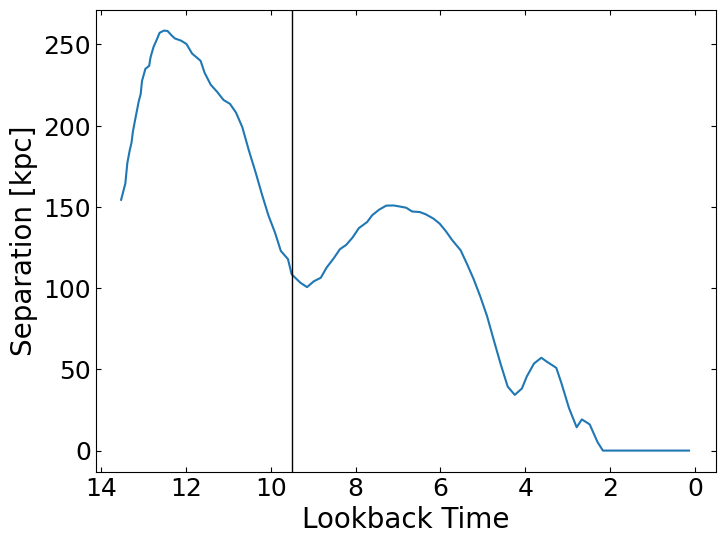

In [25]:
fig = plt.figure(figsize=(8,6))
plt.plot(snap_dict['Lookback Time'][::-1][1:],orbit['Separations'][mergers][i])       
plt.xlim(np.max(snap_dict['Lookback Time']+0.5),-0.5)
plt.xlabel("Lookback Time")
plt.ylabel("Separation [kpc]")
plt.axvline(9.5,color='black',lw=1)
plt.savefig(f"{paths.path_plots}2_pull-orbits/example-orbit.pdf")
plt.show()

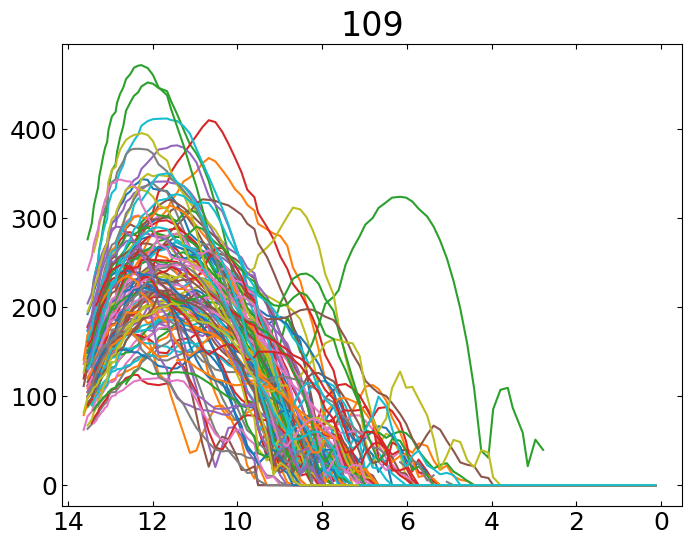

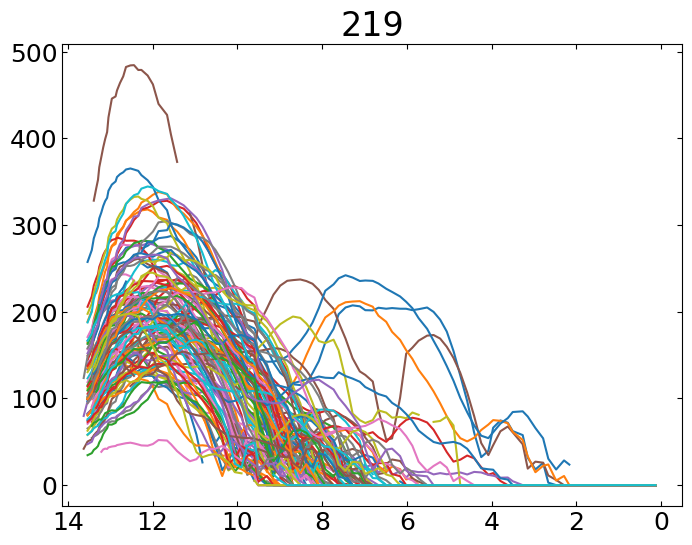

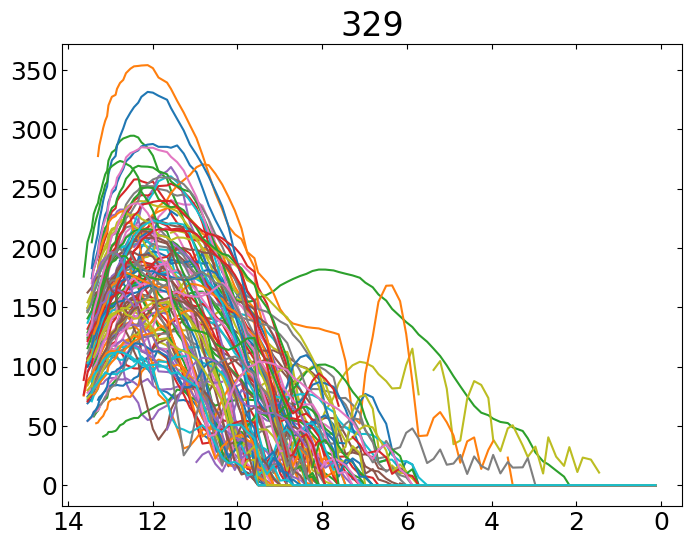

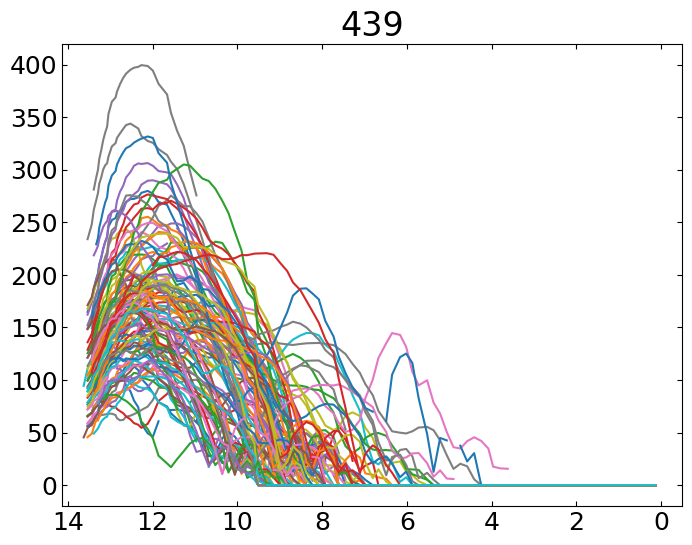

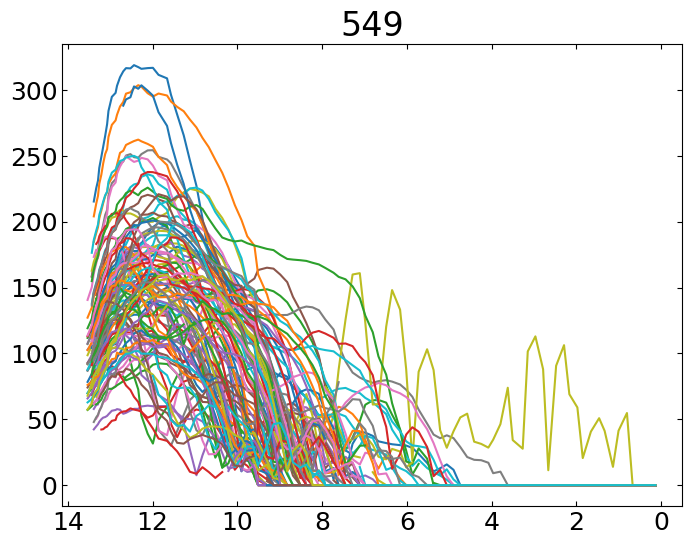

...

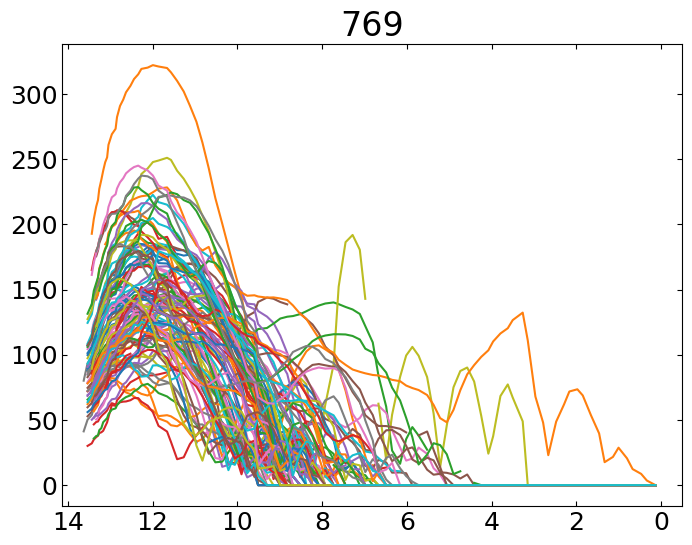

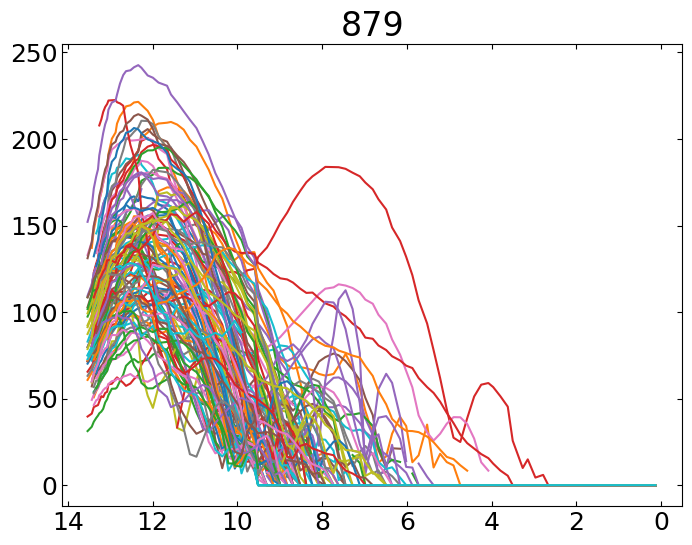

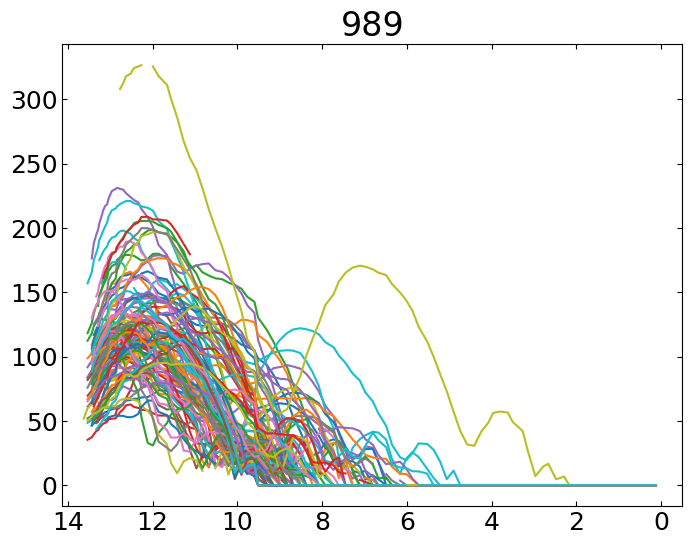

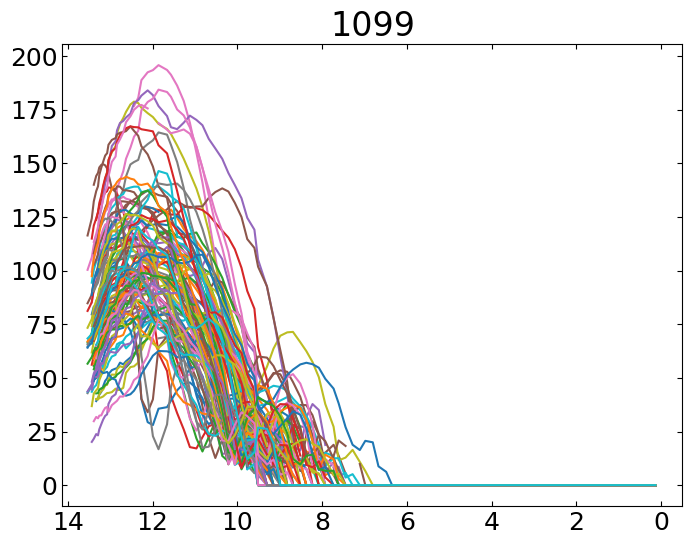

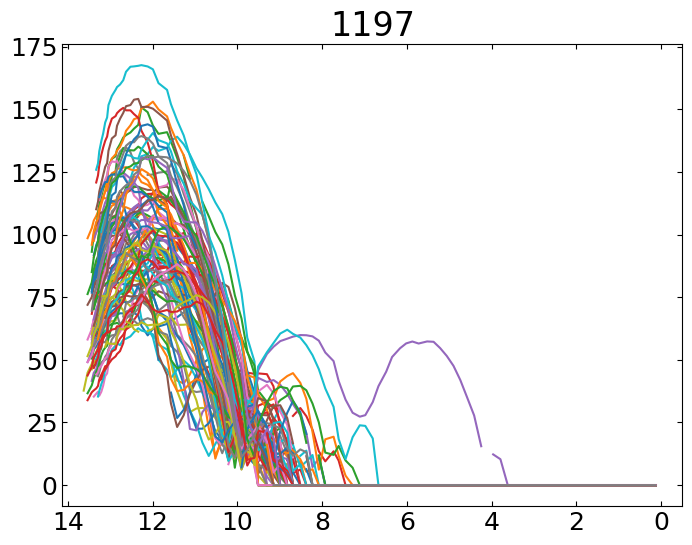

In [48]:
plotnum = 0
for i in range(nummergers):
    if plotnum%110 == 0:
        fig = plt.figure(figsize=(8,6))
    plt.plot(snap['Lookback Time'][::-1][1:],orbit['Separations'][orbit['MergerFlag']==1][i])    
    plt.title(plotnum)    
    plotnum += 1
    plt.xlim(np.max(snap['Lookback Time']+0.5),-0.5)
plt.show()

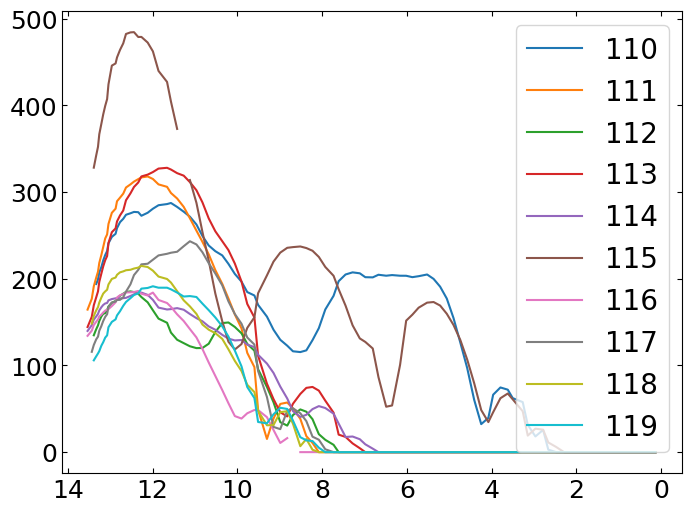

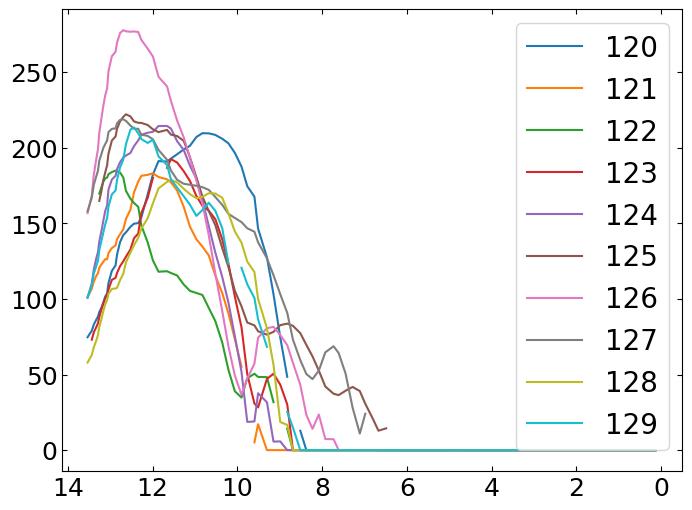

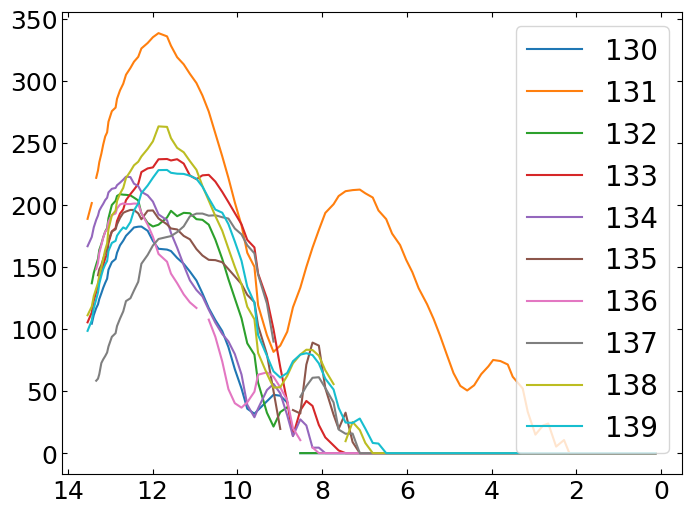

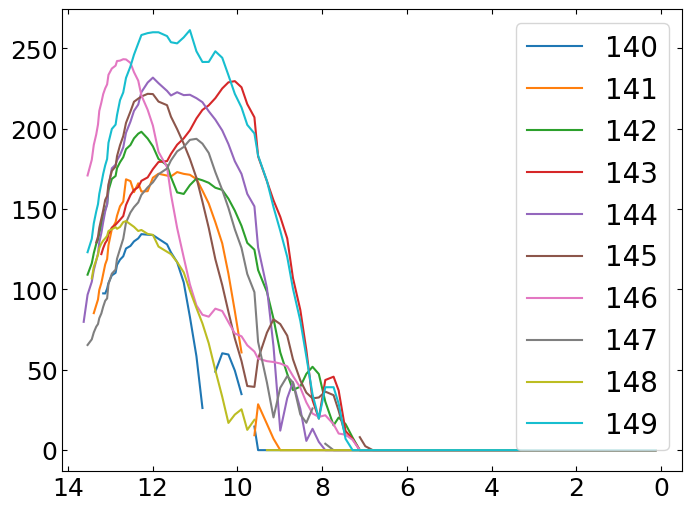

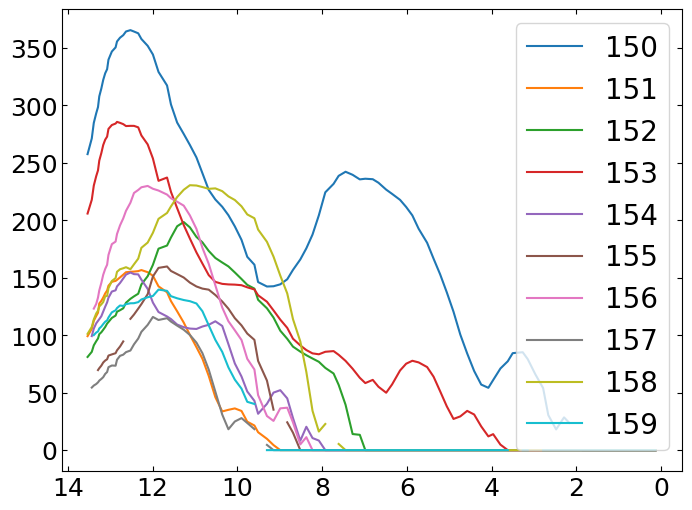

...

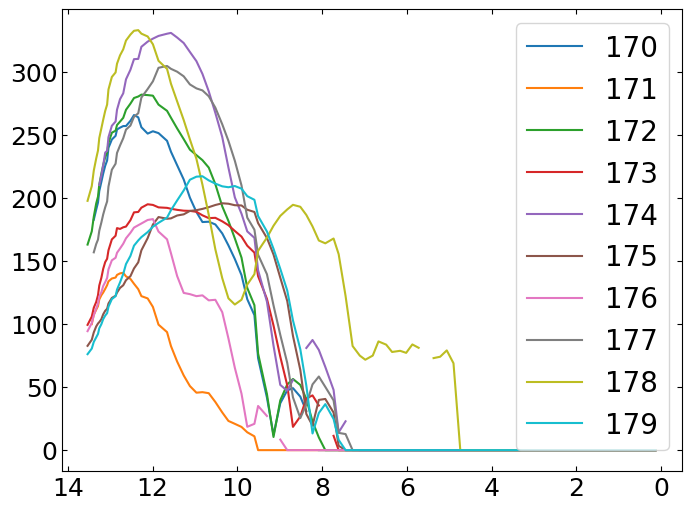

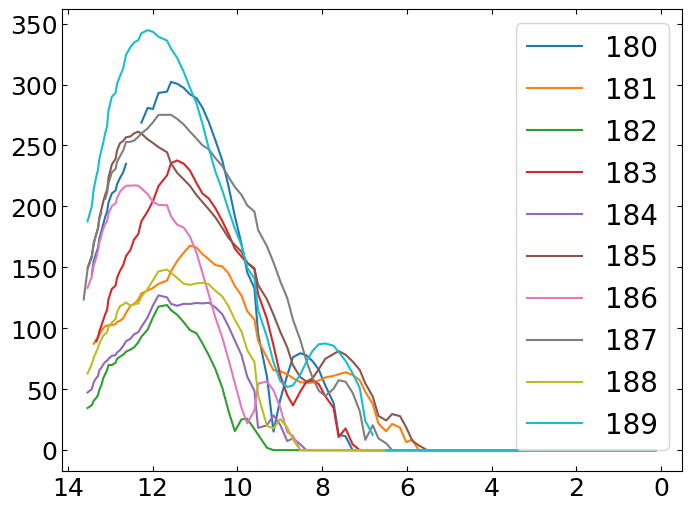

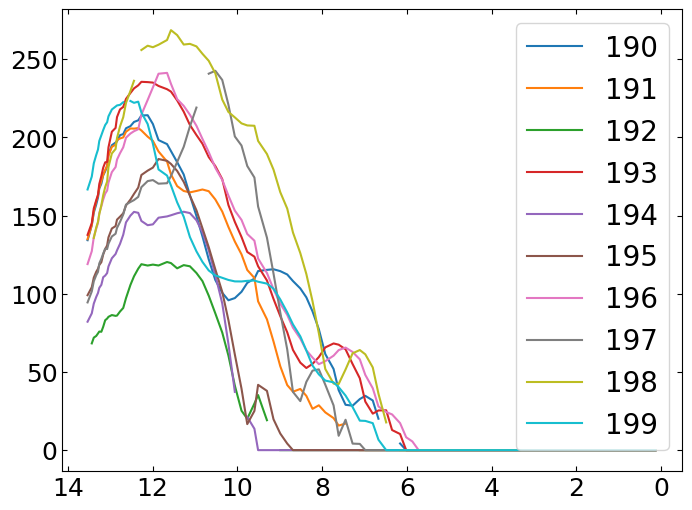

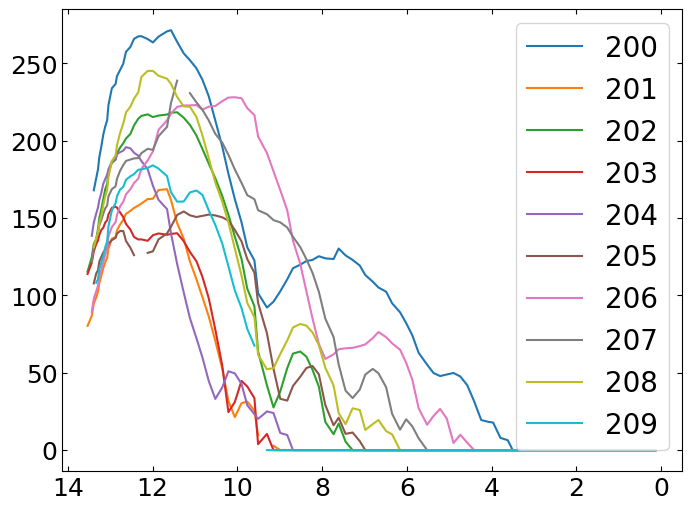

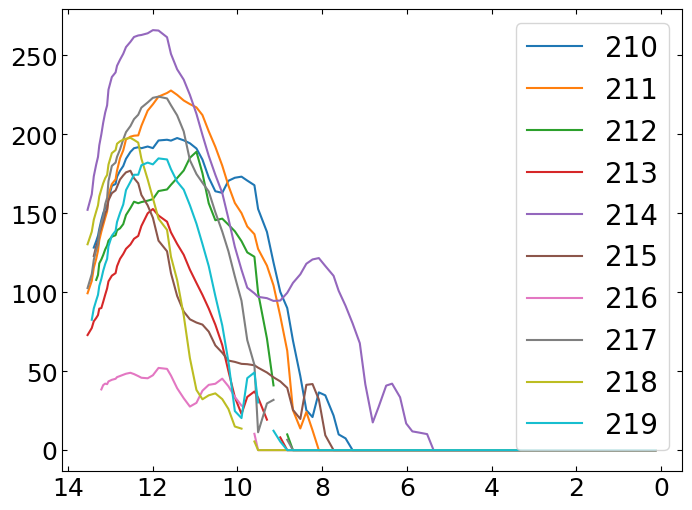

In [58]:
plotnum = 0
for i in range(nummergers)[110:220]:
    if plotnum%10 == 0:
        fig = plt.figure(figsize=(8,6))
    plotnum += 1
    plt.plot(snap['Lookback Time'][::-1][1:],orbit['Separations'][orbit['MergerFlag']==1][i],label=i)    
    plt.legend()    
    plt.xlim(np.max(snap['Lookback Time']+0.5),-0.5)
plt.show()

55 - z=4
45,29 - z=6
131 - z=2 
549-659
879 - 989

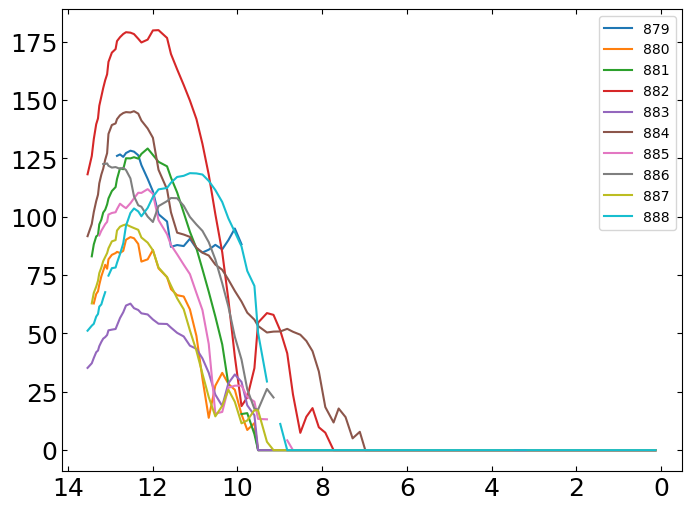

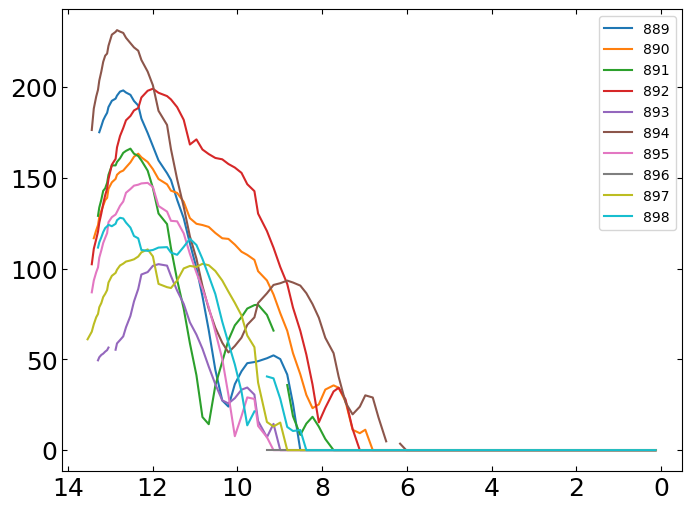

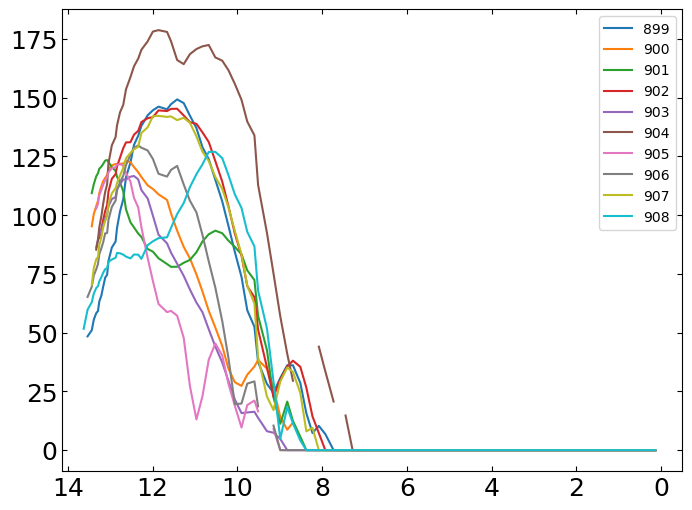

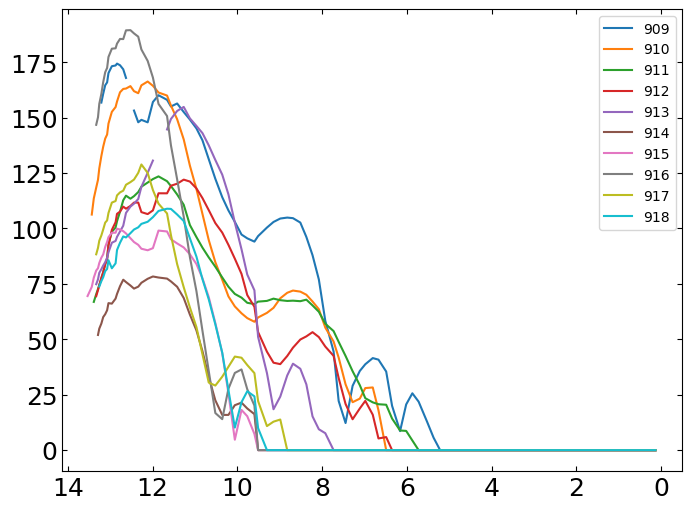

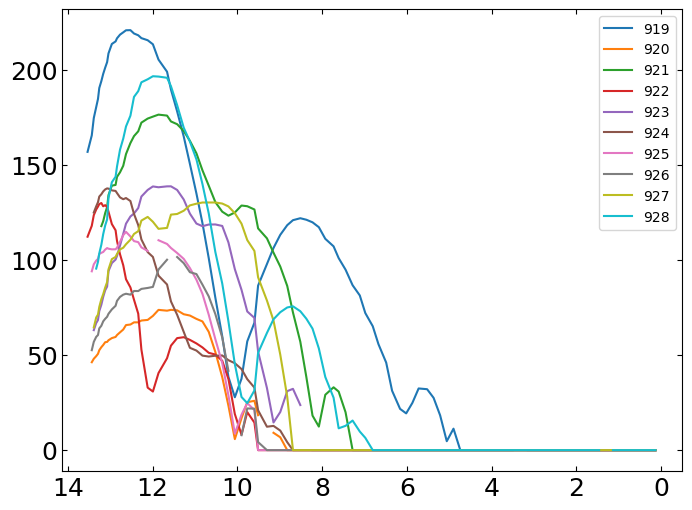

...

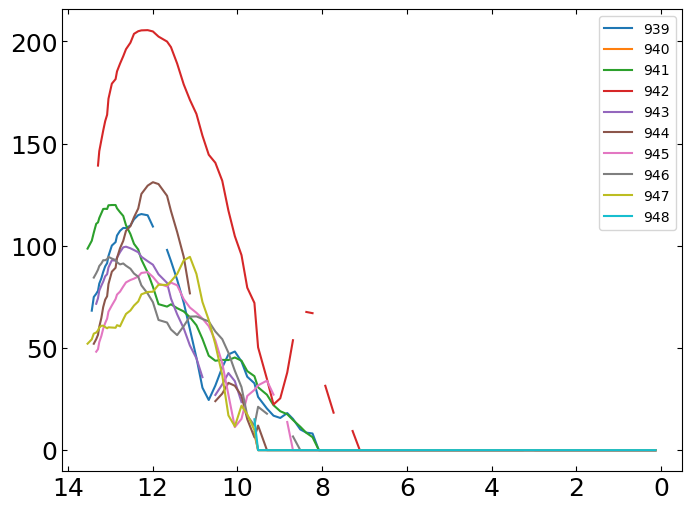

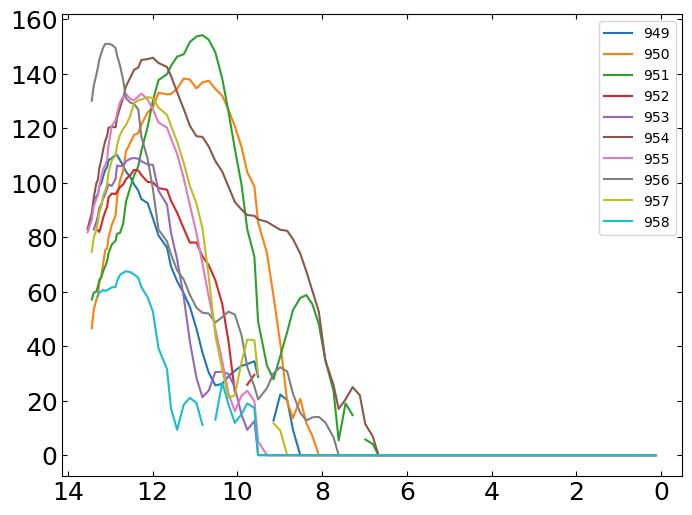

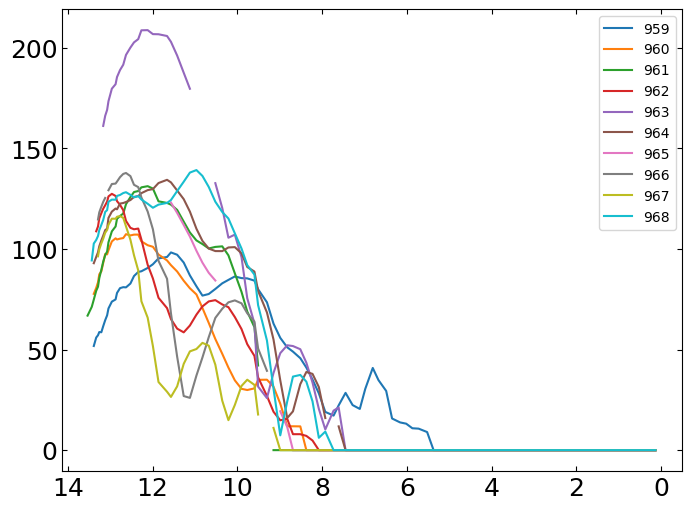

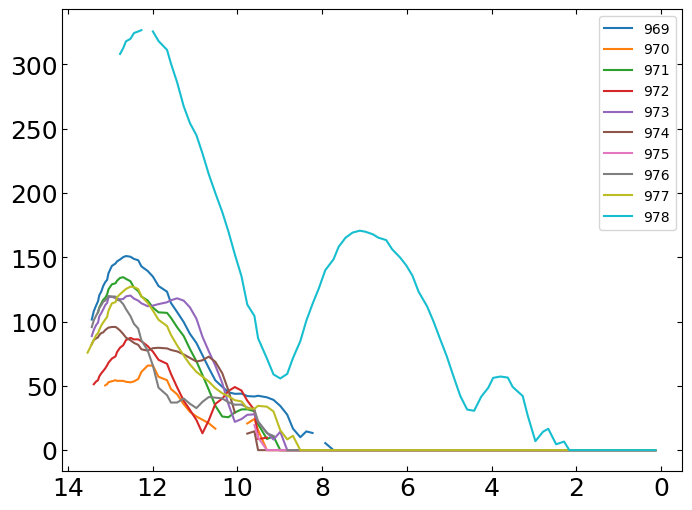

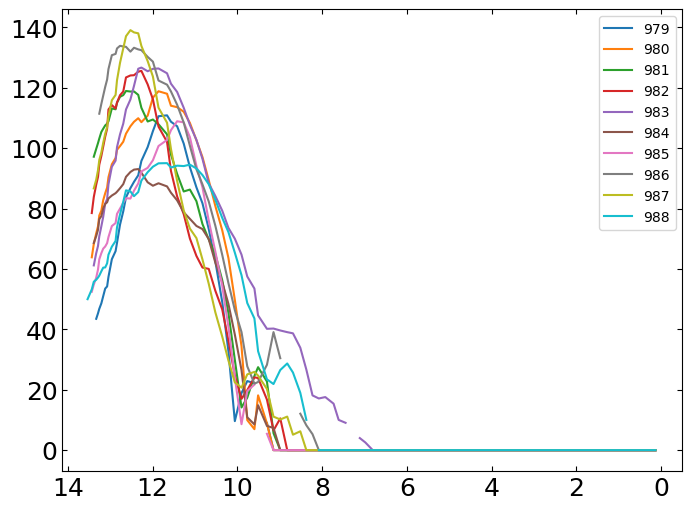

In [53]:
plotnum = 0
for i in range(nummergers)[879:989]:
    if plotnum%10 == 0:
        fig = plt.figure(figsize=(8,6))
    plotnum += 1
    plt.plot(snap['Lookback Time'][::-1][1:],orbit['Separations'][orbit['MergerFlag']==1][i],label=i)    
    plt.legend(fontsize=10)    
    plt.xlim(np.max(snap['Lookback Time']+0.5),-0.5)
plt.show()

from mergers: 
916 - early merger (z=~9.5)
29, 39, 45 - small median merger (z=6)
32, 55 - longer merger (z=4)
131, 242, 585, 978 - (z=2)
611  - late merger (z=0)

from non-mergers:


# Example orbit plots

## Merging orbits

In [219]:
# indices of table with [orbit['MergerFlag']==1] (thus, not universal indices)
merge_subind = [941,45,55,131,611]

# the subfind ids that correspond to the mergers I want to plot
merge_IDs = np.array(orbit['SubfindID1'][orbit['MergerFlag']==1][merge_subind],dtype='int32')

# corresponding indices of full table
merge_ind = [np.where(orbit['SubfindID1']==i)[0][0] for i in merge_IDs]

# create colors to correspond to mergers
cmap = plt.get_cmap('gist_heat')
colorval = np.linspace(0.2,0.8,len(merge_subind))

### Merging orbits via subind

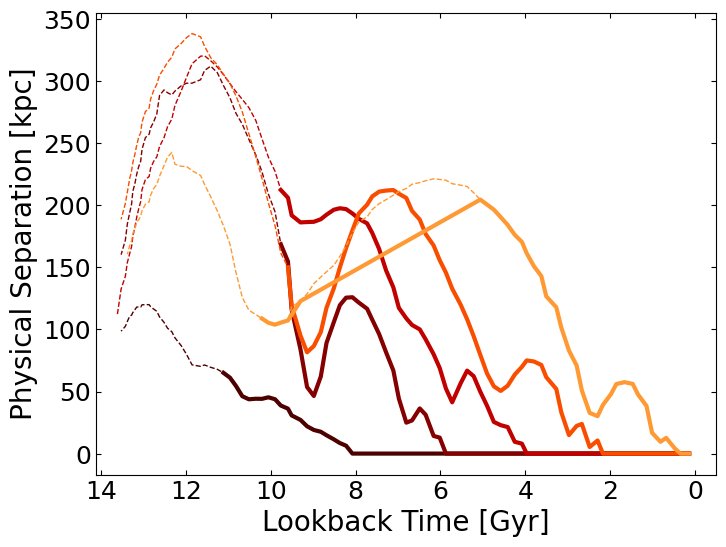

In [156]:
fig = plt.figure(figsize=(8,6))

for en, ind in enumerate(merge_subind):
    groupmask = orbit['GroupFlag'][orbit['MergerFlag']==1][ind]
    nonnanmask = ~np.isnan(orbit['Separations'][orbit['MergerFlag']==1][ind])
        
    snap_group = snap['Lookback Time'][::-1][1:][groupmask]
    orbit_group = orbit['Separations'][orbit['MergerFlag']==1][ind][groupmask]
    

    snap_nonnan = snap['Lookback Time'][::-1][1:][nonnanmask]
    orbit_nonnan = orbit['Separations'][orbit['MergerFlag']==1][ind][nonnanmask]
    
    plt.plot(snap_nonnan, orbit_nonnan, color=cmap(colorval[en]), linestyle='dashed', lw=1)    
    plt.plot(snap_group, orbit_group, label=ind, color=cmap(colorval[en]), lw=3)    

plt.ylabel("Physical Separation [kpc]")
plt.xlabel("Lookback Time [Gyr]")
             
plt.xlim(np.max(snap['Lookback Time']+0.5),-0.5)

plt.show()

### same plot but using the global ind

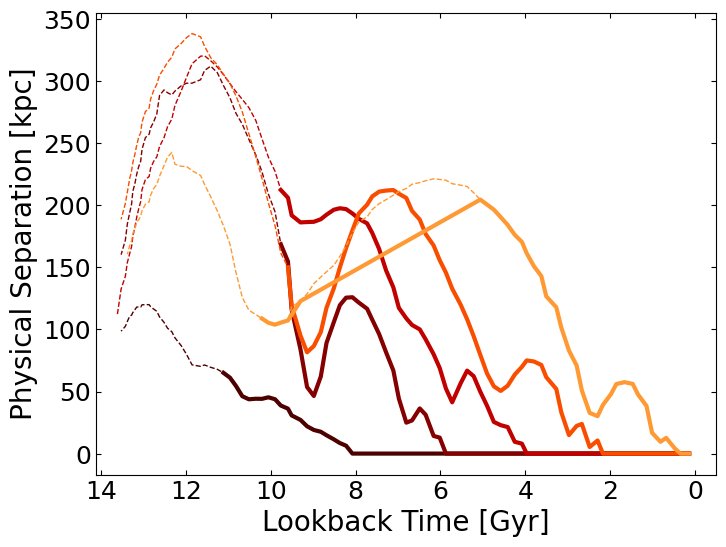

In [158]:
fig = plt.figure(figsize=(8,6))

for en, ind in enumerate(merge_ind):
    groupmask = orbit['GroupFlag'][ind]
    nonnanmask = ~np.isnan(orbit['Separations'][ind])
        
    snap_group = snap['Lookback Time'][::-1][1:][groupmask]
    orbit_group = orbit['Separations'][ind][groupmask]
    

    snap_nonnan = snap['Lookback Time'][::-1][1:][nonnanmask]
    orbit_nonnan = orbit['Separations'][ind][nonnanmask]
    
    plt.plot(snap_nonnan, orbit_nonnan, color=cmap(colorval[en]), linestyle='dashed', lw=1)    
    plt.plot(snap_group, orbit_group, label=ind, color=cmap(colorval[en]), lw=3)    

plt.ylabel("Physical Separation [kpc]")
plt.xlabel("Lookback Time [Gyr]")
             
plt.xlim(np.max(snap['Lookback Time']+0.5),-0.5)

plt.show()

### attempt to make the groups continuous
take separations where group = false and set to np.nan? 

In [159]:
orbit['GroupFlag'][ind]

array([ True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True, False,  True, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False,  True, False,  True,  True,  True,  True,
        True, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False])

array([  0.        ,   0.        ,   4.2511875 ,  12.65672006,
         9.50990669,  16.6807725 ,  38.39790735,  47.38476812,
        56.14317449,  57.53677562,  56.010117  ,  47.84086131,
        39.1839236 ,  30.16896419,  32.77579393,  50.85797827,
        70.89128679,  83.0018717 , 101.46141124, 117.84006137,
       126.6346669 , 142.988187  , 150.86891021, 161.32929056,
       170.51863407, 176.17835834, 184.11928043, 190.42434724,
       196.49479564,          nan, 204.58934097,          nan,
                nan,          nan,          nan,          nan,
                nan,          nan,          nan,          nan,
                nan,          nan,          nan,          nan,
                nan,          nan,          nan,          nan,
                nan,          nan,          nan,          nan,
                nan,          nan,          nan,          nan,
                nan, 122.82039378,          nan, 107.25264733,
       105.48952106, 103.8447505 , 105.35248469, 108.76

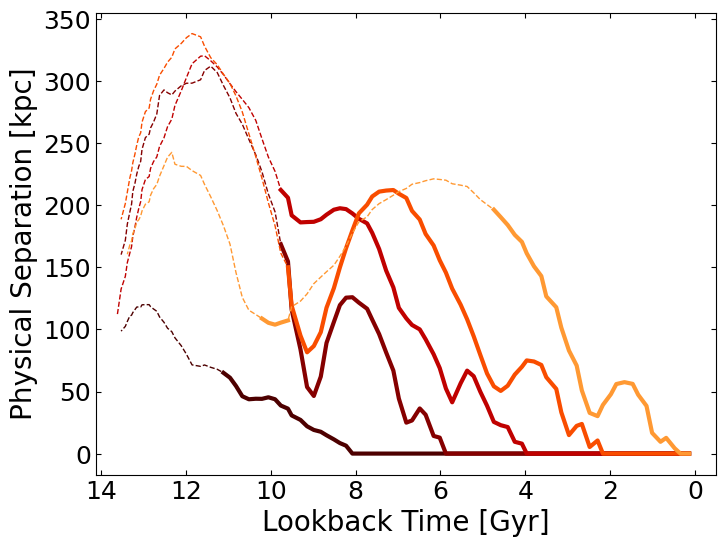

In [165]:
fig = plt.figure(figsize=(8,6))

for en, ind in enumerate(merge_ind):
    # - nonnan - #
    nonnanmask = ~np.isnan(orbit['Separations'][ind])
    snaps = snap['Lookback Time'][::-1][1:][nonnanmask]
    seps = orbit['Separations'][ind][nonnanmask]
    
    plt.plot(snaps, seps, color=cmap(colorval[en]), linestyle='dashed', lw=1)    
    
    
    # - group true - #
    snaps = snap['Lookback Time'][::-1][1:]
    seps = np.where(orbit['GroupFlag'][ind], orbit['Separations'][ind],np.nan)

    plt.plot(snaps, seps, label=ind, color=cmap(colorval[en]), lw=3)    

plt.ylabel("Physical Separation [kpc]")
plt.xlabel("Lookback Time [Gyr]")
             
plt.xlim(np.max(snap['Lookback Time']+0.5),-0.5)

plt.show()

## Nonmerging orbits

In [233]:
# indices of table with [orbit['MergerFlag']==0] (thus, not universal indices)
nomerge_subind = [112, 111, 104, 94, 74, 58, 31,130,120,126,92]
# nomerge_subind = [112, 104, 94, 74, 31,126]

# the subfind ids that correspond to the nonmergers I want to plot
nomerge_IDs = np.array(orbit['SubfindID1'][orbit['MergerFlag']==0][nomerge_subind],dtype='int32')

# corresponding indices of full table
nomerge_ind = [np.where(orbit['SubfindID1']==i)[0][0] for i in nomerge_IDs]

# create colors to correspond to nonmergers
colorval = np.linspace(0.2,0.8,len(nomerge_ind))

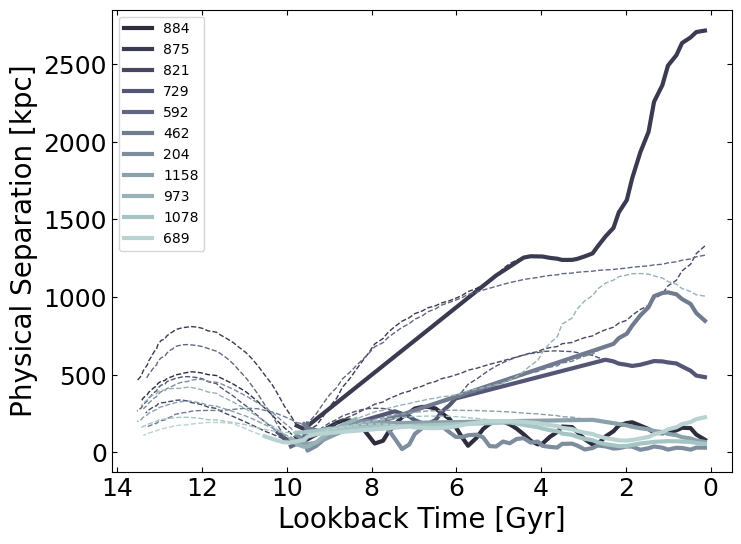

In [234]:
fig = plt.figure(figsize=(8,6))

for en, ind in enumerate(nomerge_ind):
    groupmask = orbit['GroupFlag'][ind]
    nonnanmask = ~np.isnan(orbit['Separations'][ind])
        
    snap_group = snap['Lookback Time'][::-1][1:][groupmask]
    orbit_group = orbit['Separations'][ind][groupmask]
    

    snap_nonnan = snap['Lookback Time'][::-1][1:][nonnanmask]
    orbit_nonnan = orbit['Separations'][ind][nonnanmask]
    
    plt.plot(snap_nonnan, orbit_nonnan, color=cmap(colorval[en]), linestyle='dashed', lw=1)    
    plt.plot(snap_group, orbit_group, label=ind, color=cmap(colorval[en]), lw=3)    

plt.ylabel("Physical Separation [kpc]")
plt.xlabel("Lookback Time [Gyr]")
plt.legend(fontsize=10)
plt.xlim(np.max(snap['Lookback Time']+0.5),-0.5)

plt.show()

### continuous groups

In [220]:
# indices of table with [orbit['MergerFlag']==0] (thus, not universal indices)
nomerge_subind = [112, 111, 104, 94, 74, 58, 31,130,120,126,92]
nomerge_subind = [ 94, 74, 31,120,126]

# the subfind ids that correspond to the nonmergers I want to plot
nomerge_IDs = np.array(orbit['SubfindID1'][orbit['MergerFlag']==0][nomerge_subind],dtype='int32')

# corresponding indices of full table
nomerge_ind = [np.where(orbit['SubfindID1']==i)[0][0] for i in nomerge_IDs]

# create colors to correspond to nonmergers
cmap = plt.get_cmap('bone')
colorval = np.linspace(0.2,0.8,len(nomerge_ind))

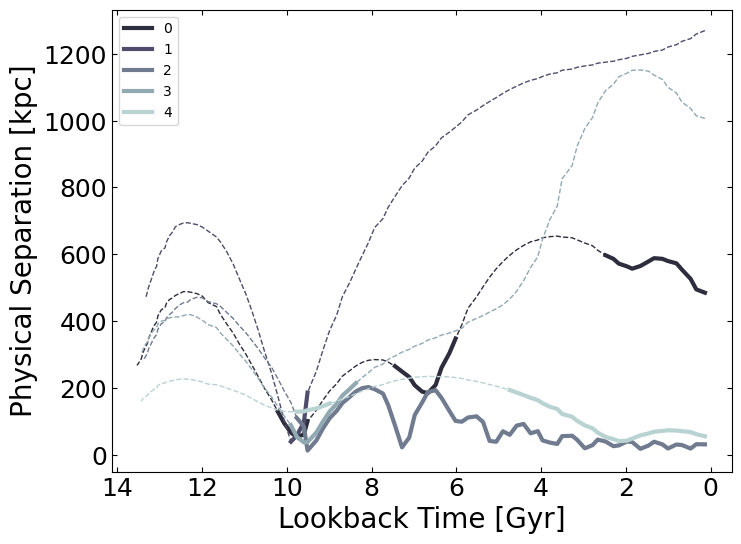

In [221]:
fig = plt.figure(figsize=(8,6))

for en, ind in enumerate(nomerge_ind):
    # - nonnan - #
    nonnanmask = ~np.isnan(orbit['Separations'][ind])
    snaps = snap['Lookback Time'][::-1][1:][nonnanmask]
    seps = orbit['Separations'][ind][nonnanmask]
    
    plt.plot(snaps, seps, color=cmap(colorval[en]), linestyle='dashed', lw=1)    
    
    
    # - group true - #
    snaps = snap['Lookback Time'][::-1][1:]
    seps = np.where(orbit['GroupFlag'][ind], orbit['Separations'][ind],np.nan)

    plt.plot(snaps, seps, label=en, color=cmap(colorval[en]), lw=3)    

plt.ylabel("Physical Separation [kpc]")
plt.xlabel("Lookback Time [Gyr]")

plt.legend(fontsize=10)
plt.xlim(np.max(snap['Lookback Time']+0.5),-0.5)

plt.show()

### likely vs. unbound

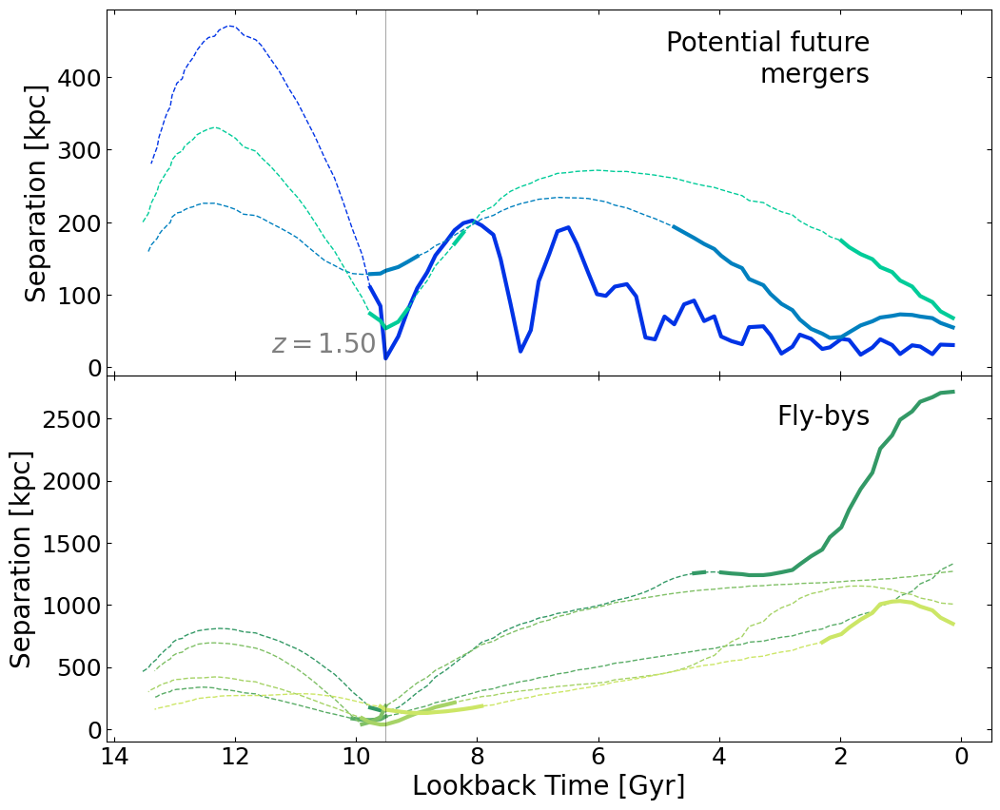

In [333]:
fig, ax = plt.subplots(2,1, figsize=(12,10), sharex=True, 
                       gridspec_kw={'width_ratios': [1], 
                                    'height_ratios':[1,1],
                                    'wspace': 0.10,
                                    "hspace":0.0})

likely_subind = [ 31,126,130] # 92, 112
unbound_subind = [ 111,104 , 74,120, 58] # 94
cmap_name = ["winter","summer"]

for plotnum, subinds in enumerate([likely_subind,unbound_subind]):
    
    # the subfind ids that correspond to the nonmergers I want to plot
    ids = np.array(orbit['SubfindID1'][orbit['MergerFlag']==0][subinds],dtype='int32')

    # corresponding indices of full table
    inds = [np.where(orbit['SubfindID1']==idd)[0][0] for idd in ids]

#     # create colors to correspond to nonmergers
#     cmap = plt.get_cmap('bone')
    colorval = np.linspace(0.2,0.8,len(inds))
    cmap = plt.get_cmap(cmap_name[plotnum])

    for en, ind in enumerate(inds):
        # - nonnan - #
        nonnanmask = ~np.isnan(orbit['Separations'][ind])
        snaps = snap['Lookback Time'][::-1][1:][nonnanmask]
        seps = orbit['Separations'][ind][nonnanmask]

        ax[plotnum].plot(snaps, seps, color=cmap(colorval[en]), linestyle='dashed', lw=1)            
#         ax[plotnum].plot(snaps, seps, color=cmap(colorval[en]), lw=2,label=subinds[en])    


        # - group true - #
        snaps = snap['Lookback Time'][::-1][1:]
        seps = np.where(orbit['GroupFlag'][ind], orbit['Separations'][ind],np.nan)

        ax[plotnum].plot(snaps, seps, color=cmap(colorval[en]), lw=3,label=subinds[en])    

# # plt.ylabel("Physical Separation [kpc]")
# # plt.xlabel("Lookback Time [Gyr]")
for i in range(2):
#     ax[i].legend(fontsize=10)
    ax[i].axvline(snap['Lookback Time'][snap['Snapshot']==40],color='black',lw=0.5,alpha=0.5)
    ax[i].set_ylabel("Separation [kpc]")
ax[0].text(snap['Lookback Time'][snap['Snapshot']==40]+0.15, 20,f"$z={snap['Redshift'][snap['Snapshot']==40][0]:.2f}$",alpha=0.5,ha='right')
# ax[1].text(snap['Lookback Time'][snap['Snapshot']==40]-0.25, 1300,"$T_{LB}$"+f"$={snap['Lookback Time'][snap['Snapshot']==40][0]:.2f}$ Gyr",alpha=0.5)
ax[0].text(1.5,425,"Potential future\nmergers",ha='right',va='center')
ax[1].text(1.5,2450,"Fly-bys",ha='right')

    
plt.xlim(np.max(snap['Lookback Time']+0.5),-0.5)
plt.xlabel("Lookback Time [Gyr]")
plt.show()

## Altogether now

In [336]:
mergers = [941,45,55,131,611]
print(np.array(orbit['SubfindID1'][orbit['MergerFlag']==1][mergers],dtype='int32'))

likely_subind = [ 31,126,130] # 92, 112
print(np.array(orbit['SubfindID1'][orbit['MergerFlag']==0][likely_subind],dtype='int32'))

unbound_subind = [ 111,104 , 74,120, 58] # 94
print(np.array(orbit['SubfindID1'][orbit['MergerFlag']==0][unbound_subind],dtype='int32'))

[446120 277085 282026 309714 397340]
[320584 447958 464542]
[419008 412090 383035 431867 360801]


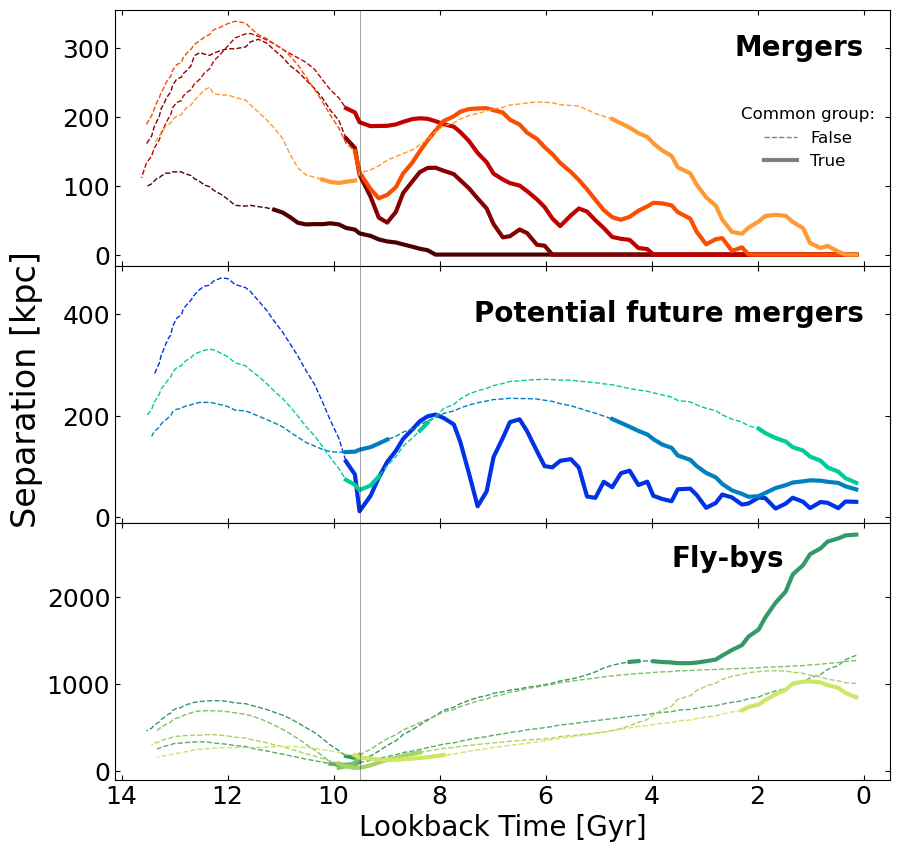

In [414]:
fig, ax = plt.subplots(3,1, figsize=(10,10), sharex=True, 
                       gridspec_kw={'width_ratios': [1], 
                                    'height_ratios':[1,1,1],
                                    'wspace': 0.10,
                                    "hspace":0.0})

# note: switched these to be subfind ids instead of indices
mergers = [446120, 277085, 282026, 309714, 397340]
likely_subind = [320584, 447958, 464542] # 92, 112
unbound_subind = [419008, 412090, 383035, 431867, 360801] # 94
cmap_name = ["gist_heat","winter","summer"]

for plotnum, subfindids in enumerate([mergers,likely_subind,unbound_subind]):

    # corresponding indices of full table
    inds = [np.where(orbit['SubfindID1']==idd)[0][0] for idd in subfindids]

    # initialize colormaps 
    colorval = np.linspace(0.2,0.8,len(inds))
    cmap = plt.get_cmap(cmap_name[plotnum])

    for en, ind in enumerate(inds):
        # - nonnan - #
        nonnanmask = ~np.isnan(orbit['Separations'][ind])
        snaps = snap['Lookback Time'][::-1][1:][nonnanmask]
        seps = orbit['Separations'][ind][nonnanmask]

        ax[plotnum].plot(snaps, seps, color=cmap(colorval[en]), linestyle='dashed', lw=1)            
#         ax[plotnum].plot(snaps, seps, color=cmap(colorval[en]), lw=2,label=subinds[en])    


        # - group true - #
        snaps = snap['Lookback Time'][::-1][1:]
        seps = np.where(orbit['GroupFlag'][ind], orbit['Separations'][ind],np.nan)

        ax[plotnum].plot(snaps, seps, color=cmap(colorval[en]), lw=3)#,label=subinds[en])    

# # plt.ylabel("Physical Separation [kpc]")
# # plt.xlabel("Lookback Time [Gyr]")
for i in range(3):
#     ax[i].legend(fontsize=10)
    ax[i].axvline(snap['Lookback Time'][snap['Snapshot']==40],color='black',lw=0.5,alpha=0.5)
fig.supylabel("Separation [kpc]")
# ax[1].text(snap['Lookback Time'][snap['Snapshot']==40]+0.15, 20,f"$z={snap['Redshift'][snap['Snapshot']==40][0]:.2f}$",alpha=0.5,ha='right')
# a[1].text(snap['Lookback Time'][snap['Snapshot']==40]-0.25, 1300,"$T_{LB}$"+f"$={snap['Lookback Time'][snap['Snapshot']==40][0]:.2f}$ Gyr",alpha=0.5)
xval = 0
# xval = (np.max(snap['Lookback Time']+0.5)+0.5)/2
ax[0].text(xval,300,"Mergers",ha='right',va='center',fontweight='semibold')
ax[1].text(xval,400,"Potential future mergers",ha='right',va='center',fontweight='semibold')
ax[2].text(xval+1.5,2350,"Fly-bys",ha='right',fontweight='semibold')
# ax[0].text(xval,300,"Mergers",ha='center',va='center')
# ax[1].text(xval,400,"Potential future mergers",ha='center',va='center')
# ax[2].text(xval,2350,"Fly-bys",ha='center')

ax[0].plot([0],[0],linestyle='dashed', lw=1,color='black',alpha=0.5,label='False')
ax[0].plot([0],[0],lw=3,color='black',alpha=0.5,label='True')
ax[0].legend(loc='center right',title="Common group:",fontsize=12,title_fontsize=12,frameon=False)
plt.xlim(np.max(snap['Lookback Time']+0.5),-0.5)
plt.xlabel("Lookback Time [Gyr]")
plt.savefig("../plots/2_pull-orbits/exorbits_physical.pdf")
plt.show()

## what about in comoving? 

In [396]:
little_h = 0.6774
scales = snap['Scale'][::-1][:-1] # gives scale in same order as orbit data
scale_matrix = np.tile(scales,(len(orbit["Separations"]),1))
sep_matrix_ckpc = orbit["Separations"]/scale_matrix*little_h  


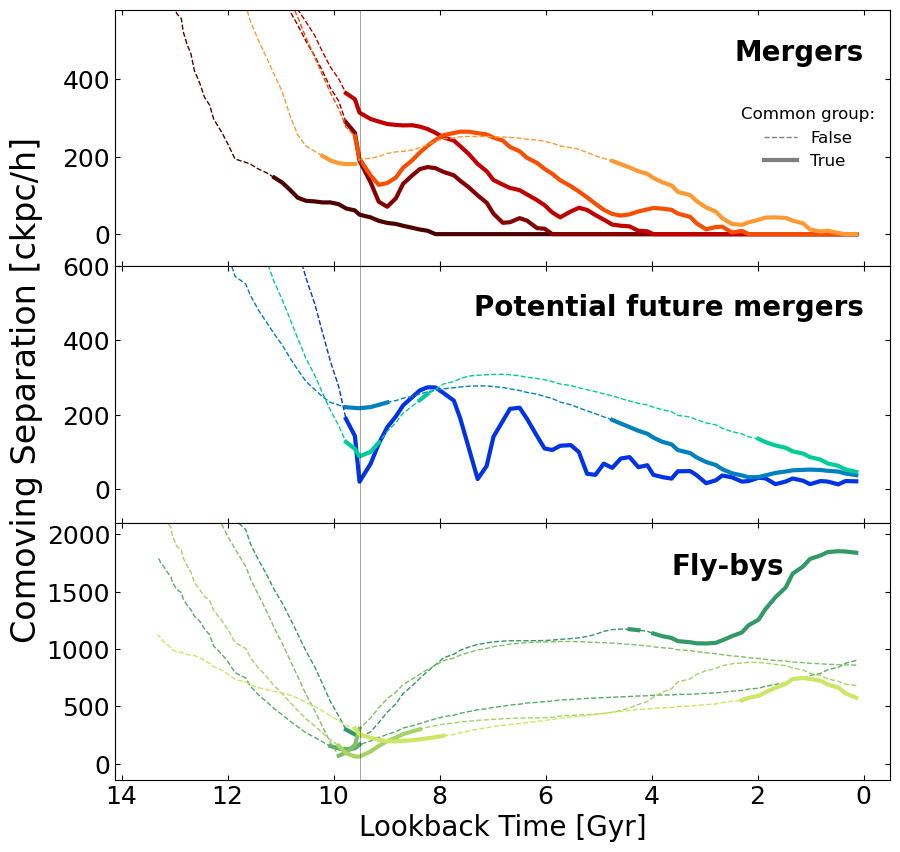

In [413]:
fig, ax = plt.subplots(3,1, figsize=(10,10), sharex=True, 
                       gridspec_kw={'width_ratios': [1], 
                                    'height_ratios':[1,1,1],
                                    'wspace': 0.10,
                                    "hspace":0.0})

# note: switched these to be subfind ids instead of indices
mergers = [446120, 277085, 282026, 309714, 397340]
likely_subind = [320584, 447958, 464542] # 92, 112
unbound_subind = [419008, 412090, 383035, 431867, 360801] # 94
cmap_name = ["gist_heat","winter","summer"]

for plotnum, subfindids in enumerate([mergers,likely_subind,unbound_subind]):

    # corresponding indices of full table
    inds = [np.where(orbit['SubfindID1']==idd)[0][0] for idd in subfindids]

    # initialize colormaps 
    colorval = np.linspace(0.2,0.8,len(inds))
    cmap = plt.get_cmap(cmap_name[plotnum])

    for en, ind in enumerate(inds):
        # - nonnan - #
        nonnanmask = ~np.isnan(sep_matrix_ckpc[ind])
        snaps = snap['Lookback Time'][::-1][1:][nonnanmask]
        seps = sep_matrix_ckpc[ind][nonnanmask]

        ax[plotnum].plot(snaps, seps, color=cmap(colorval[en]), linestyle='dashed', lw=1)            
#         ax[plotnum].plot(snaps, seps, color=cmap(colorval[en]), lw=2,label=subinds[en])    


        # - group true - #
        snaps = snap['Lookback Time'][::-1][1:]
        seps = np.where(orbit['GroupFlag'][ind], sep_matrix_ckpc[ind],np.nan)

        ax[plotnum].plot(snaps, seps, color=cmap(colorval[en]), lw=3)#,label=subinds[en])    

# # plt.ylabel("Physical Separation [kpc]")
# # plt.xlabel("Lookback Time [Gyr]")
for i in range(3):
#     ax[i].legend(fontsize=10)
    ax[i].axvline(snap['Lookback Time'][snap['Snapshot']==40],color='black',lw=0.5,alpha=0.5)
fig.supylabel("Comoving Separation [ckpc/h]")
# ax[1].text(snap['Lookback Time'][snap['Snapshot']==40]+0.15, 20,f"$z={snap['Redshift'][snap['Snapshot']==40][0]:.2f}$",alpha=0.5,ha='right')
# a[1].text(snap['Lookback Time'][snap['Snapshot']==40]-0.25, 1300,"$T_{LB}$"+f"$={snap['Lookback Time'][snap['Snapshot']==40][0]:.2f}$ Gyr",alpha=0.5)


# add legend
ax[0].plot([0],[0],linestyle='dashed', lw=1,color='black',alpha=0.5,label='False')
ax[0].plot([0],[0],lw=3,color='black',alpha=0.5,label='True')
ax[0].legend(loc='center right',title="Common group:",fontsize=12,title_fontsize=12,frameon=False)

# add labels for panels
xval = 0
ax[0].text(xval,470,"Mergers",ha='right',va='center',fontweight='semibold')
ax[1].text(xval,490,"Potential future mergers",ha='right',va='center',fontweight='semibold')
ax[2].text(xval+1.5,1650,"Fly-bys",ha='right',fontweight='semibold')

ax[0].set_ylim(top=580)
ax[1].set_ylim(top=600)
ax[2].set_ylim(top=2100)
plt.xlim(np.max(snap['Lookback Time']+0.5),-0.5)
plt.xlabel("Lookback Time [Gyr]")
plt.savefig("../plots/2_pull-orbits/exorbits_comoving.pdf")
plt.show()